# Task
Given a person’s credit-related information, build a machine learning model that can classify the credit score.

Over the years, the company has collected basic bank details and gathered a lot of credit-related information. The management wants to build an intelligent system to segregate the people into credit score brackets to reduce the manual efforts.





# Importing Libraries

In [2]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import seaborn as sns
import math


import matplotlib.pyplot as plt
import scipy.stats as ss

from sklearn.impute import SimpleImputer, KNNImputer
from sklearn.preprocessing import OneHotEncoder, MinMaxScaler, StandardScaler
from sklearn.model_selection import train_test_split, GridSearchCV
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, confusion_matrix, classification_report, roc_auc_score
from sklearn.pipeline import Pipeline
from sklearn.compose import ColumnTransformer
from sklearn.decomposition import PCA
from sklearn.neighbors import KNeighborsClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier, AdaBoostClassifier, VotingClassifier

from xgboost import XGBClassifier, plot_importance

# Data Preprocessing and Exploratory Data Analysis

In [3]:
d1=pd.read_csv('train (1).csv')

C:\Users\sujan\AppData\Local\Temp\ipykernel_26336\708506572.py:1: DtypeWarning: Columns (26) have mixed types. Specify dtype option on import or set low_memory=False.
  d1=pd.read_csv('train (1).csv')


In [4]:
d1.head()

,ID,Customer_ID,Month,Name,Age,SSN,Occupation,Annual_Income,Monthly_Inhand_Salary,Num_Bank_Accounts,...,Credit_Mix,Outstanding_Debt,Credit_Utilization_Ratio,Credit_History_Age,Payment_of_Min_Amount,Total_EMI_per_month,Amount_invested_monthly,Payment_Behaviour,Monthly_Balance,Credit_Score
0,0x1602,CUS_0xd40,January,Aaron Maashoh,23,821-00-0265,Scientist,19114.12,1824.843333,3,...,_,809.98,26.822620,22 Years and 1 Months,No,49.574949,80.41529543900253,High_spent_Small_value_payments,312.49408867943663,Good
1,0x1603,CUS_0xd40,February,Aaron Maashoh,23,821-00-0265,Scientist,19114.12,NaN,3,...,Good,809.98,31.944960,NaN,No,49.574949,118.28022162236736,Low_spent_Large_value_payments,284.62916249607184,Good
2,0x1604,CUS_0xd40,March,Aaron Maashoh,-500,821-00-0265,Scientist,19114.12,NaN,3,...,Good,809.98,28.609352,22 Years and 3 Months,No,49.574949,81.699521264648,Low_spent_Medium_value_payments,331.2098628537912,Good
3,0x1605,CUS_0xd40,April,Aaron Maashoh,23,821-00-0265,Scientist,19114.12,NaN,3,...,Good,809.98,31.377862,22 Years and 4 Months,No,49.574949,199.4580743910713,Low_spent_Small_value_payments,223.45130972736786,Good
4,0x1606,CUS_0xd40,May,Aaron Maashoh,23,821-00-0265,Scientist,19114.12,1824.843333,3,...,Good,809.98,24.797347,22 Years and 5 Months,No,49.574949,41.420153086217326,High_spent_Medium_value_payments,341.48923103222177,Good


### Data Description

ID: Unique ID of the record
Customer_ID: Unique ID of the customer

Month: Month of the year

Name: The name of the person

Age: The age of the person

SSN: Social Security Number of the person

Occupation: The occupation of the person

Annual_Income: The Annual Income of the person

Monthly_Inhand_Salary: Monthly in-hand salary of the person

Num_Bank_Accounts: The number of bank accounts of the person

Num_Credit_Card: Number of credit cards the person is having

Interest_Rate: The interest rate on the credit card of the person

Num_of_Loan: The number of loans taken by the person from the bank

Type_of_Loan: The types of loans taken by the person from the bank

Delay_from_due_date: The average number of days delayed by the person from the date of payment

Num_of_Delayed_Payment: Number of payments delayed by the person

Changed_Credit_Card: The percentage change in the credit card limit of the person

Num_Credit_Inquiries: The number of credit card inquiries by the person

Credit_Mix: Classification of Credit Mix of the customer

Outstanding_Debt: The outstanding balance of the person

Credit_Utilization_Ratio: The credit utilization ratio of the credit card of the customer

Credit_History_Age: The age of the credit history of the person

Payment_of_Min_Amount: Yes if the person paid the minimum amount to be paid only, otherwise no.

Total_EMI_per_month: The total EMI per month of the person

Amount_invested_monthly: The monthly amount invested by the person

Payment_Behaviour: The payment behaviour of the person

Monthly_Balance: The monthly balance left in the account of the person

Credit_Score: The credit score of the person

In [5]:
d1.shape

(100000, 28)

In [6]:
d1.isnull().sum()

ID                              0
Customer_ID                     0
Month                           0
Name                         9985
Age                             0
SSN                             0
Occupation                      0
Annual_Income                   0
Monthly_Inhand_Salary       15002
Num_Bank_Accounts               0
Num_Credit_Card                 0
Interest_Rate                   0
Num_of_Loan                     0
Type_of_Loan                11408
Delay_from_due_date             0
Num_of_Delayed_Payment       7002
Changed_Credit_Limit            0
Num_Credit_Inquiries         1965
Credit_Mix                      0
Outstanding_Debt                0
Credit_Utilization_Ratio        0
Credit_History_Age           9030
Payment_of_Min_Amount           0
Total_EMI_per_month             0
Amount_invested_monthly      4479
Payment_Behaviour               0
Monthly_Balance              1200
Credit_Score                    0
dtype: int64

In [7]:
d1.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 100000 entries, 0 to 99999
Data columns (total 28 columns):
 #   Column                    Non-Null Count   Dtype  
---  ------                    --------------   -----  
 0   ID                        100000 non-null  object 
 1   Customer_ID               100000 non-null  object 
 2   Month                     100000 non-null  object 
 3   Name                      90015 non-null   object 
 4   Age                       100000 non-null  object 
 5   SSN                       100000 non-null  object 
 6   Occupation                100000 non-null  object 
 7   Annual_Income             100000 non-null  object 
 8   Monthly_Inhand_Salary     84998 non-null   float64
 9   Num_Bank_Accounts         100000 non-null  int64  
 10  Num_Credit_Card           100000 non-null  int64  
 11  Interest_Rate             100000 non-null  int64  
 12  Num_of_Loan               100000 non-null  object 
 13  Type_of_Loan              88592 non-null   ob

In [8]:
d1.dtypes

ID                           object
Customer_ID                  object
Month                        object
Name                         object
Age                          object
SSN                          object
Occupation                   object
Annual_Income                object
Monthly_Inhand_Salary       float64
Num_Bank_Accounts             int64
Num_Credit_Card               int64
Interest_Rate                 int64
Num_of_Loan                  object
Type_of_Loan                 object
Delay_from_due_date           int64
Num_of_Delayed_Payment       object
Changed_Credit_Limit         object
Num_Credit_Inquiries        float64
Credit_Mix                   object
Outstanding_Debt             object
Credit_Utilization_Ratio    float64
Credit_History_Age           object
Payment_of_Min_Amount        object
Total_EMI_per_month         float64
Amount_invested_monthly      object
Payment_Behaviour            object
Monthly_Balance              object
Credit_Score                

In [9]:
d1.describe()

,Monthly_Inhand_Salary,Num_Bank_Accounts,Num_Credit_Card,Interest_Rate,Delay_from_due_date,Num_Credit_Inquiries,Credit_Utilization_Ratio,Total_EMI_per_month
count,84998.000000,100000.000000,100000.00000,100000.000000,100000.000000,98035.000000,100000.000000,100000.000000
mean,4194.170850,17.091280,22.47443,72.466040,21.068780,27.754251,32.285173,1403.118217
std,3183.686167,117.404834,129.05741,466.422621,14.860104,193.177339,5.116875,8306.041270
min,303.645417,-1.000000,0.00000,1.000000,-5.000000,0.000000,20.000000,0.000000
25%,1625.568229,3.000000,4.00000,8.000000,10.000000,3.000000,28.052567,30.306660
50%,3093.745000,6.000000,5.00000,13.000000,18.000000,6.000000,32.305784,69.249473
75%,5957.448333,7.000000,7.00000,20.000000,28.000000,9.000000,36.496663,161.224249
max,15204.633333,1798.000000,1499.00000,5797.000000,67.000000,2597.000000,50.000000,82331.000000


In [10]:
((d1.isnull().sum())/(d1.shape[0]))*100

ID                           0.000
Customer_ID                  0.000
Month                        0.000
Name                         9.985
Age                          0.000
SSN                          0.000
Occupation                   0.000
Annual_Income                0.000
Monthly_Inhand_Salary       15.002
Num_Bank_Accounts            0.000
Num_Credit_Card              0.000
Interest_Rate                0.000
Num_of_Loan                  0.000
Type_of_Loan                11.408
Delay_from_due_date          0.000
Num_of_Delayed_Payment       7.002
Changed_Credit_Limit         0.000
Num_Credit_Inquiries         1.965
Credit_Mix                   0.000
Outstanding_Debt             0.000
Credit_Utilization_Ratio     0.000
Credit_History_Age           9.030
Payment_of_Min_Amount        0.000
Total_EMI_per_month          0.000
Amount_invested_monthly      4.479
Payment_Behaviour            0.000
Monthly_Balance              1.200
Credit_Score                 0.000
dtype: float64

In [11]:
d1.nunique()

ID                          100000
Customer_ID                  12500
Month                            8
Name                         10139
Age                           1788
SSN                          12501
Occupation                      16
Annual_Income                18940
Monthly_Inhand_Salary        13235
Num_Bank_Accounts              943
Num_Credit_Card               1179
Interest_Rate                 1750
Num_of_Loan                    434
Type_of_Loan                  6260
Delay_from_due_date             73
Num_of_Delayed_Payment         749
Changed_Credit_Limit          4384
Num_Credit_Inquiries          1223
Credit_Mix                       4
Outstanding_Debt             13178
Credit_Utilization_Ratio    100000
Credit_History_Age             404
Payment_of_Min_Amount            3
Total_EMI_per_month          14950
Amount_invested_monthly      91049
Payment_Behaviour                7
Monthly_Balance              98792
Credit_Score                     3
dtype: int64

In [12]:
# Drop the Columns we not use in model
d1.drop(columns=['ID', 'Customer_ID','Name', 'SSN'], inplace=True)

In [13]:
d1.select_dtypes(include="object").describe().T

,count,unique,top,freq
Month,100000,8,January,12500
Age,100000,1788,38,2833
Occupation,100000,16,_______,7062
Annual_Income,100000,18940,36585.12,16
Num_of_Loan,100000,434,3,14386
Type_of_Loan,88592,6260,Not Specified,1408
Num_of_Delayed_Payment,92998,749,19,5327
Changed_Credit_Limit,100000,4384,_,2091
Credit_Mix,100000,4,Standard,36479
Outstanding_Debt,100000,13178,1360.45,24


# Initial Conversion

In [14]:
d1.select_dtypes('object').describe().T

,count,unique,top,freq
Month,100000,8,January,12500
Age,100000,1788,38,2833
Occupation,100000,16,_______,7062
Annual_Income,100000,18940,36585.12,16
Num_of_Loan,100000,434,3,14386
Type_of_Loan,88592,6260,Not Specified,1408
Num_of_Delayed_Payment,92998,749,19,5327
Changed_Credit_Limit,100000,4384,_,2091
Credit_Mix,100000,4,Standard,36479
Outstanding_Debt,100000,13178,1360.45,24


In [15]:
# Removing Special Character 

d1 = d1.applymap(lambda x: x if x is np.NaN or not isinstance(x, str) else 
                 str(x).strip('_ ,"')).replace(['',
                                                '_',
                                                '-', 
                                                '-333333333333333333333333333'
                                                ,'nan', 
                                                '__10000__',
                                                '!@9#%8', 
                                                '#F%$D@*&8'], np.NaN)


d1.applymap(lambda x: x if x is np.NaN or not isinstance(x, str) else str(x).strip('_ ,"')): This line applies a lambda function to each element in the DataFrame d1. The lambda function checks if the element (x) is either np.NaN (a NumPy NaN value) or not an instance of a string. If it meets either of these conditions, the element remains unchanged. Otherwise, if the element is a string, leading and trailing underscores, spaces, and commas are stripped using the strip() method, and the modified string is returned.

In [16]:
d1.select_dtypes('object').describe().T

,count,unique,top,freq
Month,100000,8,January,12500
Age,100000,1728,38,2994
Occupation,92938,15,Lawyer,6575
Annual_Income,100000,13487,17816.75,16
Num_of_Loan,100000,414,3,15104
Type_of_Loan,88592,6260,Not Specified,1408
Num_of_Delayed_Payment,92998,711,19,5481
Changed_Credit_Limit,97909,4383,8.22,133
Credit_Mix,79805,3,Standard,36479
Outstanding_Debt,100000,12203,1109.03,24


In [17]:
d1.isnull().sum()

Month                           0
Age                             0
Occupation                   7062
Annual_Income                   0
Monthly_Inhand_Salary       15002
Num_Bank_Accounts               0
Num_Credit_Card                 0
Interest_Rate                   0
Num_of_Loan                     0
Type_of_Loan                11408
Delay_from_due_date             0
Num_of_Delayed_Payment       7002
Changed_Credit_Limit         2091
Num_Credit_Inquiries         1965
Credit_Mix                  20195
Outstanding_Debt                0
Credit_Utilization_Ratio        0
Credit_History_Age           9030
Payment_of_Min_Amount           0
Total_EMI_per_month             0
Amount_invested_monthly      4479
Payment_Behaviour            7600
Monthly_Balance              1209
Credit_Score                    0
dtype: int64

In [18]:
# Cleaning the Age column

d1['Age'] = d1.Age.str.replace('-', '')

In [19]:
# Rounding Some column into 2 decimal places, 
# but first we move convert it from obect to a float
d1['Monthly_Balance'] = d1.Monthly_Balance.astype(float)
d1['Amount_invested_monthly'] = d1.Amount_invested_monthly.astype(float)
d1['Total_EMI_per_month'] = d1.Total_EMI_per_month.astype(float)
d1['Credit_Utilization_Ratio'] = d1.Credit_Utilization_Ratio.astype(float)
d1['Monthly_Inhand_Salary'] = d1.Monthly_Inhand_Salary.astype(float)
d1['Annual_Income'] = d1.Annual_Income.astype(float)
d1['Outstanding_Debt'] = d1.Outstanding_Debt.astype(float)
d1['Age'] = d1.Age.astype(float)
d1['Num_of_Loan'] =d1['Num_of_Loan'].astype(int)
d1['Num_of_Delayed_Payment'] =d1['Num_of_Delayed_Payment'].astype(float)
d1['Changed_Credit_Limit'] = d1['Changed_Credit_Limit'].astype(float)
d1['Num_Credit_Inquiries'] = d1['Num_Credit_Inquiries'].astype(float)

In [20]:
#Rounding the values into two decimal places
d1['Monthly_Inhand_Salary']= d1['Monthly_Inhand_Salary'].round(2)
d1['Monthly_Balance'] = d1['Monthly_Balance'].round(decimals = 2)
d1['Amount_invested_monthly'] = d1['Amount_invested_monthly'].round(decimals = 2)
d1['Total_EMI_per_month'] = d1['Total_EMI_per_month'].round(decimals = 2)
d1['Credit_Utilization_Ratio'] =  d1['Credit_Utilization_Ratio'].round(decimals = 2)
d1['Monthly_Inhand_Salary'] = d1['Monthly_Inhand_Salary'].round(decimals = 2)
d1['Annual_Income'] = d1['Annual_Income'].round(decimals = 2)

In [21]:
d1.shape

(100000, 24)

In [22]:
# Set the display options
pd.set_option('display.max_columns', None)
d1

,Month,Age,Occupation,Annual_Income,Monthly_Inhand_Salary,Num_Bank_Accounts,Num_Credit_Card,Interest_Rate,Num_of_Loan,Type_of_Loan,Delay_from_due_date,Num_of_Delayed_Payment,Changed_Credit_Limit,Num_Credit_Inquiries,Credit_Mix,Outstanding_Debt,Credit_Utilization_Ratio,Credit_History_Age,Payment_of_Min_Amount,Total_EMI_per_month,Amount_invested_monthly,Payment_Behaviour,Monthly_Balance,Credit_Score
0,January,23.0,Scientist,19114.12,1824.84,3,4,3,4,"Auto Loan, Credit-Builder Loan, Personal Loan,...",3,7.0,11.27,4.0,NaN,809.98,26.82,22 Years and 1 Months,No,49.57,80.42,High_spent_Small_value_payments,312.49,Good
1,February,23.0,Scientist,19114.12,NaN,3,4,3,4,"Auto Loan, Credit-Builder Loan, Personal Loan,...",-1,NaN,11.27,4.0,Good,809.98,31.94,NaN,No,49.57,118.28,Low_spent_Large_value_payments,284.63,Good
2,March,500.0,Scientist,19114.12,NaN,3,4,3,4,"Auto Loan, Credit-Builder Loan, Personal Loan,...",3,7.0,NaN,4.0,Good,809.98,28.61,22 Years and 3 Months,No,49.57,81.70,Low_spent_Medium_value_payments,331.21,Good
3,April,23.0,Scientist,19114.12,NaN,3,4,3,4,"Auto Loan, Credit-Builder Loan, Personal Loan,...",5,4.0,6.27,4.0,Good,809.98,31.38,22 Years and 4 Months,No,49.57,199.46,Low_spent_Small_value_payments,223.45,Good
4,May,23.0,Scientist,19114.12,1824.84,3,4,3,4,"Auto Loan, Credit-Builder Loan, Personal Loan,...",6,NaN,11.27,4.0,Good,809.98,24.80,22 Years and 5 Months,No,49.57,41.42,High_spent_Medium_value_payments,341.49,Good
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
99995,April,25.0,Mechanic,39628.99,3359.42,4,6,7,2,"Auto Loan, and Student Loan",23,7.0,11.50,3.0,NaN,502.38,34.66,31 Years and 6 Months,No,35.10,60.97,High_spent_Large_value_payments,479.87,Poor
99996,May,25.0,Mechanic,39628.99,3359.42,4,6,7,2,"Auto Loan, and Student Loan",18,7.0,11.50,3.0,NaN,502.38,40.57,31 Years and 7 Months,No,35.10,54.19,High_spent_Medium_value_payments,496.65,Poor
99997,June,25.0,Mechanic,39628.99,3359.42,4,6,5729,2,"Auto Loan, and Student Loan",27,6.0,11.50,3.0,Good,502.38,41.26,31 Years and 8 Months,No,35.10,24.03,High_spent_Large_value_payments,516.81,Poor
99998,July,25.0,Mechanic,39628.99,3359.42,4,6,7,2,"Auto Loan, and Student Loan",20,NaN,11.50,3.0,Good,502.38,33.64,31 Years and 9 Months,No,35.10,251.67,Low_spent_Large_value_payments,319.16,Standard


In [23]:
d1

,Month,Age,Occupation,Annual_Income,Monthly_Inhand_Salary,Num_Bank_Accounts,Num_Credit_Card,Interest_Rate,Num_of_Loan,Type_of_Loan,Delay_from_due_date,Num_of_Delayed_Payment,Changed_Credit_Limit,Num_Credit_Inquiries,Credit_Mix,Outstanding_Debt,Credit_Utilization_Ratio,Credit_History_Age,Payment_of_Min_Amount,Total_EMI_per_month,Amount_invested_monthly,Payment_Behaviour,Monthly_Balance,Credit_Score
0,January,23.0,Scientist,19114.12,1824.84,3,4,3,4,"Auto Loan, Credit-Builder Loan, Personal Loan,...",3,7.0,11.27,4.0,NaN,809.98,26.82,22 Years and 1 Months,No,49.57,80.42,High_spent_Small_value_payments,312.49,Good
1,February,23.0,Scientist,19114.12,NaN,3,4,3,4,"Auto Loan, Credit-Builder Loan, Personal Loan,...",-1,NaN,11.27,4.0,Good,809.98,31.94,NaN,No,49.57,118.28,Low_spent_Large_value_payments,284.63,Good
2,March,500.0,Scientist,19114.12,NaN,3,4,3,4,"Auto Loan, Credit-Builder Loan, Personal Loan,...",3,7.0,NaN,4.0,Good,809.98,28.61,22 Years and 3 Months,No,49.57,81.70,Low_spent_Medium_value_payments,331.21,Good
3,April,23.0,Scientist,19114.12,NaN,3,4,3,4,"Auto Loan, Credit-Builder Loan, Personal Loan,...",5,4.0,6.27,4.0,Good,809.98,31.38,22 Years and 4 Months,No,49.57,199.46,Low_spent_Small_value_payments,223.45,Good
4,May,23.0,Scientist,19114.12,1824.84,3,4,3,4,"Auto Loan, Credit-Builder Loan, Personal Loan,...",6,NaN,11.27,4.0,Good,809.98,24.80,22 Years and 5 Months,No,49.57,41.42,High_spent_Medium_value_payments,341.49,Good
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
99995,April,25.0,Mechanic,39628.99,3359.42,4,6,7,2,"Auto Loan, and Student Loan",23,7.0,11.50,3.0,NaN,502.38,34.66,31 Years and 6 Months,No,35.10,60.97,High_spent_Large_value_payments,479.87,Poor
99996,May,25.0,Mechanic,39628.99,3359.42,4,6,7,2,"Auto Loan, and Student Loan",18,7.0,11.50,3.0,NaN,502.38,40.57,31 Years and 7 Months,No,35.10,54.19,High_spent_Medium_value_payments,496.65,Poor
99997,June,25.0,Mechanic,39628.99,3359.42,4,6,5729,2,"Auto Loan, and Student Loan",27,6.0,11.50,3.0,Good,502.38,41.26,31 Years and 8 Months,No,35.10,24.03,High_spent_Large_value_payments,516.81,Poor
99998,July,25.0,Mechanic,39628.99,3359.42,4,6,7,2,"Auto Loan, and Student Loan",20,NaN,11.50,3.0,Good,502.38,33.64,31 Years and 9 Months,No,35.10,251.67,Low_spent_Large_value_payments,319.16,Standard


In [24]:
# Cleeaning the Age column, removing outliers and replacing characters with the median of the Age values

for i in d1.Age.values:
    if i > 95:
        d1.Age.replace(i, np.median(d1.Age), inplace=True)
        
# Replacing the inconsistent entry in the Age column

d1.Age.replace(-500, np.median(d1.Age), inplace=True)
for i in d1.Age.values:
    if i > 95:
        d1.Age.replace(i, np.median(d1.Age), inplace=True)

In [25]:
d1['Age'].max()

95.0

In [26]:
for i in d1:
    a=d1[i].unique()
    print(a)

['January' 'February' 'March' 'April' 'May' 'June' 'July' 'August']
[23. 34. 28. 54. 55. 21. 31. 33. 30. 24. 44. 45. 40. 41. 32. 35. 36. 39.
 37. 20. 46. 26. 42. 19. 48. 38. 43. 22. 16. 18. 15. 27. 25. 14. 17. 47.
 53. 56. 29. 49. 51. 50. 52. 95.]
['Scientist' nan 'Teacher' 'Engineer' 'Entrepreneur' 'Developer' 'Lawyer'
 'Media_Manager' 'Doctor' 'Journalist' 'Manager' 'Accountant' 'Musician'
 'Mechanic' 'Writer' 'Architect']
[ 19114.12  34847.84 143162.64 ...  37188.1   20002.88  39628.99]
[1824.84     nan 3037.99 ... 3097.01 1929.91 3359.42]
[   3    2    1    7    4    0    8    5    6    9   10 1414 1231   67
  572 1488   91  528 1647 1696 1338  649  889 1668  685  857  975 1496
 1534 1620   37 1388 1429 1332 1588  120 1777 1096  803  494  744 1139
  831 1613  741  121  665 1748 1644  823 1356 1651   87  711  450  210
 1671 1722  648  672 1662 1495  510  666  429 1131 1434  980 1026  526
  718 1300 1312 1315  501 1566  480 1042  322  628 1016  333 1265  791
  427  563  905 1190 1036

In [27]:
d1['Occupation'].unique()

array(['Scientist', nan, 'Teacher', 'Engineer', 'Entrepreneur',
       'Developer', 'Lawyer', 'Media_Manager', 'Doctor', 'Journalist',
       'Manager', 'Accountant', 'Musician', 'Mechanic', 'Writer',
       'Architect'], dtype=object)

<AxesSubplot:ylabel='Frequency'>

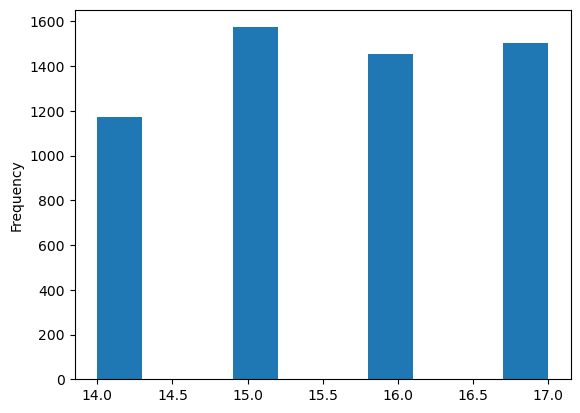

In [28]:
d1[d1['Age'] < 18]['Age'].plot.hist()

In [29]:
a=d1[d1['Age'] < 18]

In [30]:
#d1.replace(a, np.nan, inplace=True)
d1.loc[d1['Age'] < 18, 'Age'] = np.nan
#replaced values which are small are than 18
#minimum 18 years of age to apply for a Credit Card

In [31]:
d1['Age'].min()

18.0

In [32]:
d1['Age'].isnull().sum()

5706

In [33]:
d1['Num_Bank_Accounts'].min()

-1

In [34]:
d1.loc[d1['Num_Bank_Accounts'] < 1, 'Num_Bank_Accounts'] = np.nan
#converted all values lesser than 1

In [35]:
d1.loc[d1['Num_of_Loan'] < 1, 'Num_of_Loan'] = np.nan

In [36]:
d1['Num_of_Loan'].min()

1.0

In [37]:
d1['Delay_from_due_date'].min()
d1.loc[d1['Delay_from_due_date'] < 0, 'Delay_from_due_date'] = np.nan

In [38]:
d1.loc[d1['Num_of_Delayed_Payment'] < 0, 'Num_of_Delayed_Payment'] = np.nan

In [39]:

d1.loc[d1['Changed_Credit_Limit'] < 0, 'Changed_Credit_Limit'] = np.nan

In [40]:
d1.min()

C:\Users\sujan\AppData\Local\Temp\ipykernel_26336\941420863.py:1: FutureWarning: Dropping of nuisance columns in DataFrame reductions (with 'numeric_only=None') is deprecated; in a future version this will raise TypeError.  Select only valid columns before calling the reduction.
  d1.min()


Month                         April
Age                            18.0
Annual_Income               7005.93
Monthly_Inhand_Salary        303.65
Num_Bank_Accounts               1.0
Num_Credit_Card                   0
Interest_Rate                     1
Num_of_Loan                     1.0
Delay_from_due_date             0.0
Num_of_Delayed_Payment          0.0
Changed_Credit_Limit            0.0
Num_Credit_Inquiries            0.0
Outstanding_Debt               0.23
Credit_Utilization_Ratio       20.0
Payment_of_Min_Amount            NM
Total_EMI_per_month             0.0
Amount_invested_monthly         0.0
Monthly_Balance                0.01
Credit_Score                   Good
dtype: object

# Null value Treatment

In [41]:
duplicate_rows = d1.duplicated().sum()

# Display the duplicate rows
print(duplicate_rows)

0


In [42]:
d1.isnull().sum()

Month                           0
Age                          5706
Occupation                   7062
Annual_Income                   0
Monthly_Inhand_Salary       15002
Num_Bank_Accounts            4349
Num_Credit_Card                 0
Interest_Rate                   0
Num_of_Loan                 14806
Type_of_Loan                11408
Delay_from_due_date           591
Num_of_Delayed_Payment       7646
Changed_Credit_Limit         3677
Num_Credit_Inquiries         1965
Credit_Mix                  20195
Outstanding_Debt                0
Credit_Utilization_Ratio        0
Credit_History_Age           9030
Payment_of_Min_Amount           0
Total_EMI_per_month             0
Amount_invested_monthly      4479
Payment_Behaviour            7600
Monthly_Balance              1209
Credit_Score                    0
dtype: int64

In [43]:
#Occupation 

In [44]:
d1['Occupation'].unique()

array(['Scientist', nan, 'Teacher', 'Engineer', 'Entrepreneur',
       'Developer', 'Lawyer', 'Media_Manager', 'Doctor', 'Journalist',
       'Manager', 'Accountant', 'Musician', 'Mechanic', 'Writer',
       'Architect'], dtype=object)

C:\Users\sujan\anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


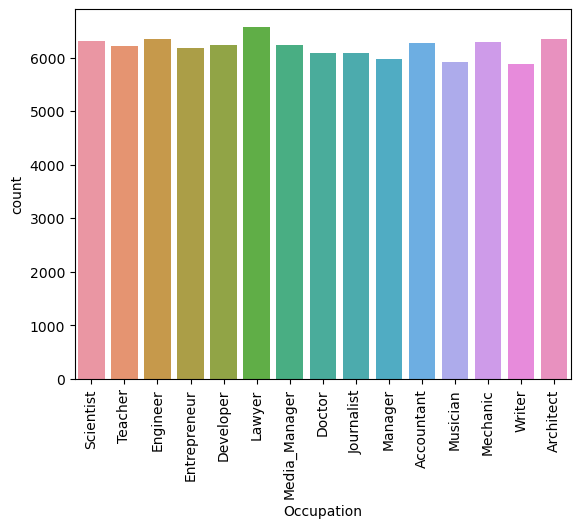

In [45]:
sns.countplot(d1['Occupation'])
plt.xticks(rotation=90)

# Show the plot
plt.show()

In [46]:
#so we cant replace 'nan' with mode, so we drop them

In [47]:
d1.dropna(subset=['Occupation'], inplace=True)

In [48]:
d1.isnull().sum()

Month                           0
Age                          5299
Occupation                      0
Annual_Income                   0
Monthly_Inhand_Salary       13942
Num_Bank_Accounts            4053
Num_Credit_Card                 0
Interest_Rate                   0
Num_of_Loan                 13694
Type_of_Loan                10543
Delay_from_due_date           537
Num_of_Delayed_Payment       7089
Changed_Credit_Limit         3411
Num_Credit_Inquiries         1839
Credit_Mix                  18774
Outstanding_Debt                0
Credit_Utilization_Ratio        0
Credit_History_Age           8406
Payment_of_Min_Amount           0
Total_EMI_per_month             0
Amount_invested_monthly      4160
Payment_Behaviour            7086
Monthly_Balance              1133
Credit_Score                    0
dtype: int64

In [49]:
#Monthly_Inhand_Salary

In [50]:
d1['Monthly_Inhand_Salary']

0        1824.84
1            NaN
2            NaN
3            NaN
4        1824.84
          ...   
99995    3359.42
99996    3359.42
99997    3359.42
99998    3359.42
99999    3359.42
Name: Monthly_Inhand_Salary, Length: 92938, dtype: float64

In [51]:
# Step 1: Sort the data by 'age' column in descending order
d1.sort_values(by='Age', ascending=False)

# Step 2: Use backward fill (bfill) to replace NaN values in 'monthly salary' column
d1['Monthly_Inhand_Salary'].fillna(method='bfill', inplace=True)

# Display the updated DataFrame
print(d1.isnull().sum())

Month                           0
Age                          5299
Occupation                      0
Annual_Income                   0
Monthly_Inhand_Salary           0
Num_Bank_Accounts            4053
Num_Credit_Card                 0
Interest_Rate                   0
Num_of_Loan                 13694
Type_of_Loan                10543
Delay_from_due_date           537
Num_of_Delayed_Payment       7089
Changed_Credit_Limit         3411
Num_Credit_Inquiries         1839
Credit_Mix                  18774
Outstanding_Debt                0
Credit_Utilization_Ratio        0
Credit_History_Age           8406
Payment_of_Min_Amount           0
Total_EMI_per_month             0
Amount_invested_monthly      4160
Payment_Behaviour            7086
Monthly_Balance              1133
Credit_Score                    0
dtype: int64


In [52]:
#Monthly_Balance

In [53]:
# Step 1: Sort the data by 'age' column in descending order
d1.sort_values(by='Age', ascending=False)

# Step 2: Use backward fill (bfill) to replace NaN values in 'monthly salary' column
d1['Monthly_Balance'].fillna(method='bfill', inplace=True)

# Display the updated DataFrame
print(d1.isnull().sum())

Month                           0
Age                          5299
Occupation                      0
Annual_Income                   0
Monthly_Inhand_Salary           0
Num_Bank_Accounts            4053
Num_Credit_Card                 0
Interest_Rate                   0
Num_of_Loan                 13694
Type_of_Loan                10543
Delay_from_due_date           537
Num_of_Delayed_Payment       7089
Changed_Credit_Limit         3411
Num_Credit_Inquiries         1839
Credit_Mix                  18774
Outstanding_Debt                0
Credit_Utilization_Ratio        0
Credit_History_Age           8406
Payment_of_Min_Amount           0
Total_EMI_per_month             0
Amount_invested_monthly      4160
Payment_Behaviour            7086
Monthly_Balance                 0
Credit_Score                    0
dtype: int64


In [54]:
#Amount_invested_monthly

In [55]:
# Step 1: Sort the data by 'age' column in descending order
d1.sort_values(by='Age', ascending=False)

# Step 2: Use backward fill (bfill) to replace NaN values in 'monthly salary' column
d1['Amount_invested_monthly'].fillna(method='bfill', inplace=True)

# Display the updated DataFrame
print(d1.isnull().sum())

Month                           0
Age                          5299
Occupation                      0
Annual_Income                   0
Monthly_Inhand_Salary           0
Num_Bank_Accounts            4053
Num_Credit_Card                 0
Interest_Rate                   0
Num_of_Loan                 13694
Type_of_Loan                10543
Delay_from_due_date           537
Num_of_Delayed_Payment       7089
Changed_Credit_Limit         3411
Num_Credit_Inquiries         1839
Credit_Mix                  18774
Outstanding_Debt                0
Credit_Utilization_Ratio        0
Credit_History_Age           8406
Payment_of_Min_Amount           0
Total_EMI_per_month             0
Amount_invested_monthly         0
Payment_Behaviour            7086
Monthly_Balance                 0
Credit_Score                    0
dtype: int64


In [56]:
#Payment_Behaviour 

In [57]:
d1['Payment_Behaviour'].nunique()

6

C:\Users\sujan\anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


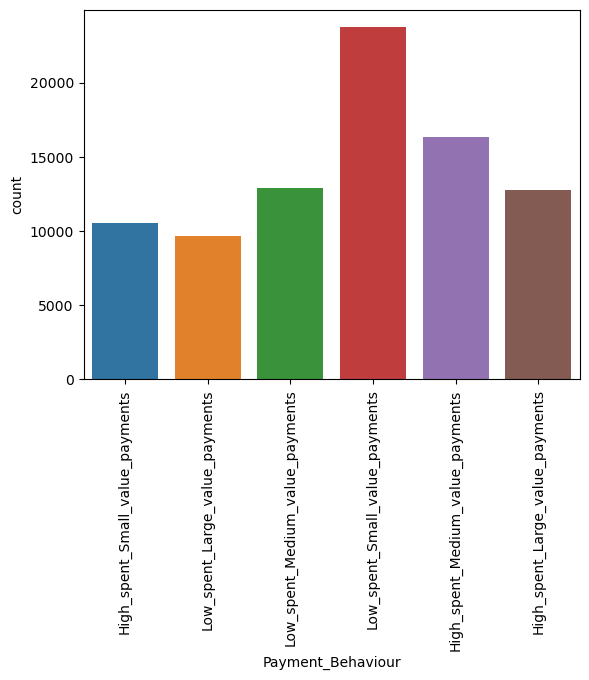

In [58]:
sns.countplot(d1['Payment_Behaviour'])
plt.xticks(rotation=90)

# Show the plot
plt.show()

In [59]:
d1['Payment_Behaviour'].nunique()

6

In [60]:

# Calculate the mode of the column
mode_value = d1['Payment_Behaviour'].mode()[0]

# Replace NaN values with the mode value
d1['Payment_Behaviour'].fillna(mode_value, inplace=True)
print(d1.isnull().sum())

Month                           0
Age                          5299
Occupation                      0
Annual_Income                   0
Monthly_Inhand_Salary           0
Num_Bank_Accounts            4053
Num_Credit_Card                 0
Interest_Rate                   0
Num_of_Loan                 13694
Type_of_Loan                10543
Delay_from_due_date           537
Num_of_Delayed_Payment       7089
Changed_Credit_Limit         3411
Num_Credit_Inquiries         1839
Credit_Mix                  18774
Outstanding_Debt                0
Credit_Utilization_Ratio        0
Credit_History_Age           8406
Payment_of_Min_Amount           0
Total_EMI_per_month             0
Amount_invested_monthly         0
Payment_Behaviour               0
Monthly_Balance                 0
Credit_Score                    0
dtype: int64


In [61]:
#Credit_History_Age 

In [62]:
d1['Credit_History_Age'].nunique()

404

In [63]:
#Transform the information to the value
d1['Credit_History_Age'] = d1['Credit_History_Age'].astype(str).str.replace(' Years and ','.')
d1['Credit_History_Age'] = d1['Credit_History_Age'].astype(str).str.replace('Months','')

In [137]:
# Step 1: Sort the data by 'age' column in descending order
d1.sort_values(by='Age', ascending=False)

# Step 2: Use backward fill (bfill) to replace NaN values in 'monthly salary' column
d1['Credit_History_Age'].fillna(method='ffill', inplace=True)

# Display the updated DataFrame
print(d1.isnull().sum())

Age                         0
Occupation                  0
Annual_Income               0
Num_Bank_Accounts           0
Num_Credit_Card             0
Interest_Rate               0
Num_of_Loan                 0
Delay_from_due_date         0
Num_of_Delayed_Payment      0
Changed_Credit_Limit        0
Num_Credit_Inquiries        0
Credit_Mix                  0
Outstanding_Debt            0
Credit_Utilization_Ratio    0
Credit_History_Age          0
Total_EMI_per_month         0
Amount_invested_monthly     0
Credit_Score                0
dtype: int64


C:\Users\sujan\AppData\Local\Temp\ipykernel_26336\3978594590.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  d1['Credit_History_Age'].fillna(method='ffill', inplace=True)


In [65]:
#Credit_Mix

C:\Users\sujan\anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


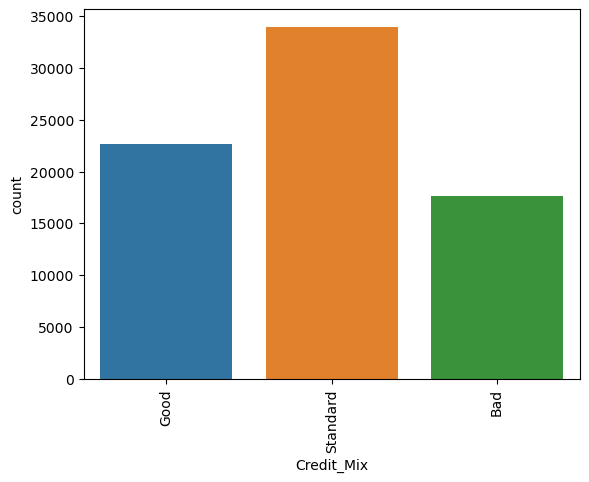

In [66]:
sns.countplot(d1['Credit_Mix'])
plt.xticks(rotation=90)

# Show the plot
plt.show()

In [67]:
# Step 1: Sort the data by 'age' column in descending order
d1.sort_values(by='Age', ascending=False)

# Step 2: Use backward fill (bfill) to replace NaN values in 'monthly salary' column
d1['Credit_Mix'].fillna(method='ffill', inplace=True)

# Display the updated DataFrame
print(d1.isnull().sum())

Month                           0
Age                          5299
Occupation                      0
Annual_Income                   0
Monthly_Inhand_Salary           0
Num_Bank_Accounts            4053
Num_Credit_Card                 0
Interest_Rate                   0
Num_of_Loan                 13694
Type_of_Loan                10543
Delay_from_due_date           537
Num_of_Delayed_Payment       7089
Changed_Credit_Limit         3411
Num_Credit_Inquiries         1839
Credit_Mix                      1
Outstanding_Debt                0
Credit_Utilization_Ratio        0
Credit_History_Age              0
Payment_of_Min_Amount           0
Total_EMI_per_month             0
Amount_invested_monthly         0
Payment_Behaviour               0
Monthly_Balance                 0
Credit_Score                    0
dtype: int64


In [68]:
d1.sort_values(by='Age', ascending=False)

# Step 2: Use backward fill (bfill) to replace NaN values in 'monthly salary' column
d1['Credit_History_Age'].fillna(method='ffill', inplace=True)

# Display the updated DataFrame
print(d1.isnull().sum())

Month                           0
Age                          5299
Occupation                      0
Annual_Income                   0
Monthly_Inhand_Salary           0
Num_Bank_Accounts            4053
Num_Credit_Card                 0
Interest_Rate                   0
Num_of_Loan                 13694
Type_of_Loan                10543
Delay_from_due_date           537
Num_of_Delayed_Payment       7089
Changed_Credit_Limit         3411
Num_Credit_Inquiries         1839
Credit_Mix                      1
Outstanding_Debt                0
Credit_Utilization_Ratio        0
Credit_History_Age              0
Payment_of_Min_Amount           0
Total_EMI_per_month             0
Amount_invested_monthly         0
Payment_Behaviour               0
Monthly_Balance                 0
Credit_Score                    0
dtype: int64


In [69]:
d1.sort_values(by='Age', ascending=False)

# Step 2: Use backward fill (bfill) to replace NaN values in 'monthly salary' column
d1['Num_of_Loan'].fillna(method='ffill', inplace=True)

# Display the updated DataFrame
print(d1.isnull().sum())

Month                           0
Age                          5299
Occupation                      0
Annual_Income                   0
Monthly_Inhand_Salary           0
Num_Bank_Accounts            4053
Num_Credit_Card                 0
Interest_Rate                   0
Num_of_Loan                     0
Type_of_Loan                10543
Delay_from_due_date           537
Num_of_Delayed_Payment       7089
Changed_Credit_Limit         3411
Num_Credit_Inquiries         1839
Credit_Mix                      1
Outstanding_Debt                0
Credit_Utilization_Ratio        0
Credit_History_Age              0
Payment_of_Min_Amount           0
Total_EMI_per_month             0
Amount_invested_monthly         0
Payment_Behaviour               0
Monthly_Balance                 0
Credit_Score                    0
dtype: int64


In [70]:
#Num_Credit_Inquiries, Changed_Credit_Limit,Credit_Mix, Num_of_Delayed_Payment, Delay_from_due_date','Num_Bank_Accounts','Age', Step 1: Sort the data by 'age' column in descending order
d1.sort_values(by='Age', ascending=False)

# Step 2: Use backward fill (bfill) to replace NaN values in 'monthly salary' column
d1['Credit_Mix'].fillna(method='ffill', inplace=True)

# Display the updated DataFrame
print(d1.isnull().sum())

Month                           0
Age                          5299
Occupation                      0
Annual_Income                   0
Monthly_Inhand_Salary           0
Num_Bank_Accounts            4053
Num_Credit_Card                 0
Interest_Rate                   0
Num_of_Loan                     0
Type_of_Loan                10543
Delay_from_due_date           537
Num_of_Delayed_Payment       7089
Changed_Credit_Limit         3411
Num_Credit_Inquiries         1839
Credit_Mix                      1
Outstanding_Debt                0
Credit_Utilization_Ratio        0
Credit_History_Age              0
Payment_of_Min_Amount           0
Total_EMI_per_month             0
Amount_invested_monthly         0
Payment_Behaviour               0
Monthly_Balance                 0
Credit_Score                    0
dtype: int64


In [71]:
d1.dropna(subset=['Num_Credit_Inquiries','Changed_Credit_Limit'], inplace=True)

In [72]:
d1.dropna(subset=['Credit_Mix'], inplace=True)

In [73]:
d1.dropna(subset=['Num_of_Delayed_Payment'], inplace=True)

In [74]:
d1.dropna(subset=['Delay_from_due_date','Num_Bank_Accounts','Age'], inplace=True)

In [75]:
d1.isnull().sum()

Month                          0
Age                            0
Occupation                     0
Annual_Income                  0
Monthly_Inhand_Salary          0
Num_Bank_Accounts              0
Num_Credit_Card                0
Interest_Rate                  0
Num_of_Loan                    0
Type_of_Loan                8098
Delay_from_due_date            0
Num_of_Delayed_Payment         0
Changed_Credit_Limit           0
Num_Credit_Inquiries           0
Credit_Mix                     0
Outstanding_Debt               0
Credit_Utilization_Ratio       0
Credit_History_Age             0
Payment_of_Min_Amount          0
Total_EMI_per_month            0
Amount_invested_monthly        0
Payment_Behaviour              0
Monthly_Balance                0
Credit_Score                   0
dtype: int64

In [76]:
d1['Num_of_Delayed_Payment'].mode()

0    19.0
Name: Num_of_Delayed_Payment, dtype: float64

In [77]:
d1['Num_of_Delayed_Payment'].nunique()

585

In [78]:
#Type_of_Loan

In [79]:
d1['Type_of_Loan'].nunique()

5803

In [82]:
d1['Type_of_Loan'].value_counts()

Not Specified                                                                                           985
Credit-Builder Loan                                                                                     972
Personal Loan                                                                                           961
Debt Consolidation Loan                                                                                 939
Mortgage Loan                                                                                           874
                                                                                                       ... 
Home Equity Loan, Not Specified, Credit-Builder Loan, Auto Loan, Student Loan, and Mortgage Loan          1
Mortgage Loan, Student Loan, Mortgage Loan, Home Equity Loan, Personal Loan, and Credit-Builder Loan      1
Not Specified, Home Equity Loan, Student Loan, and Student Loan                                           1
Auto Loan, Personal Loan, No

There is a multi class problem here. We will deal with it later

In [83]:
#It seems some records have more than one loan type. So we can explore all types and evaluate each as a binary feature

In [84]:
d1['Type_of_Loan'].replace({np.nan:'Not_Specified'}, inplace = True)

In [85]:
loan_types = {}


for loans in d1['Type_of_Loan']:
    loans = loans.split(',')
    loans = [x.strip() for x in loans]
    
    # for getting rid of 'and' in last item of loans  
    if len(loans) > 1:
        loans[-1] = loans[-1][4:]
        
    for loan in loans:
        if loan in loan_types:
            loan_types[loan] += 1
        else:
            loan_types[loan] = 1

In [86]:
d1['Type_of_Loan'].mode()

0    Not_Specified
Name: Type_of_Loan, dtype: object

In [87]:
d1.isnull().sum()

Month                       0
Age                         0
Occupation                  0
Annual_Income               0
Monthly_Inhand_Salary       0
Num_Bank_Accounts           0
Num_Credit_Card             0
Interest_Rate               0
Num_of_Loan                 0
Type_of_Loan                0
Delay_from_due_date         0
Num_of_Delayed_Payment      0
Changed_Credit_Limit        0
Num_Credit_Inquiries        0
Credit_Mix                  0
Outstanding_Debt            0
Credit_Utilization_Ratio    0
Credit_History_Age          0
Payment_of_Min_Amount       0
Total_EMI_per_month         0
Amount_invested_monthly     0
Payment_Behaviour           0
Monthly_Balance             0
Credit_Score                0
dtype: int64

In [88]:
#no null values

# Outlier treatment

C:\Users\sujan\anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


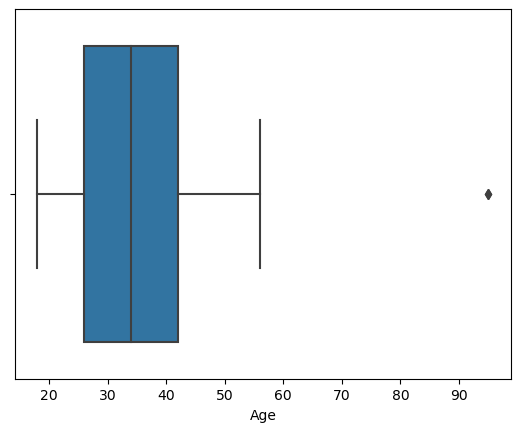

min 18.0 max 95.0


C:\Users\sujan\anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


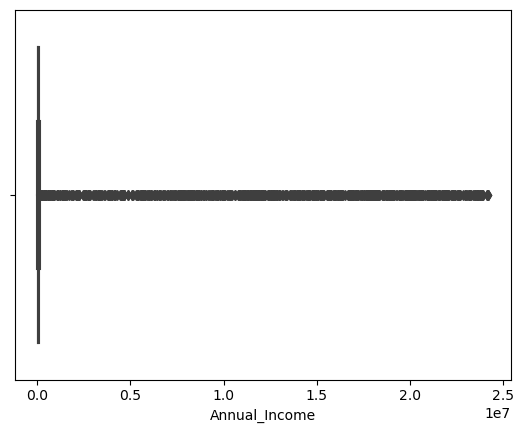

min 7006.04 max 24198062.0


C:\Users\sujan\anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


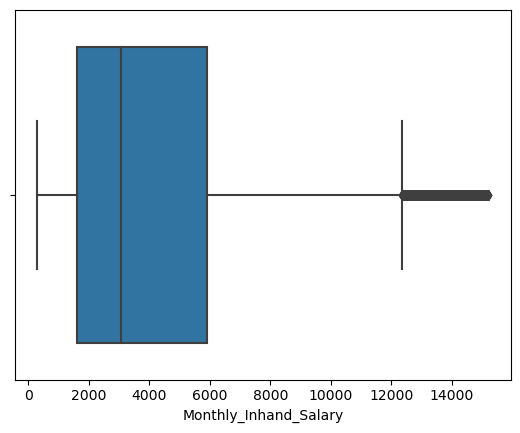

min 303.65 max 15204.63


C:\Users\sujan\anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


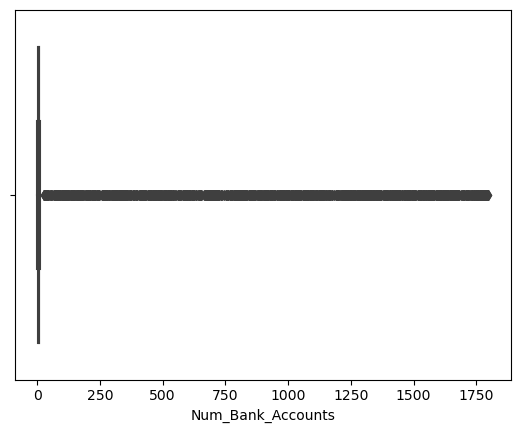

C:\Users\sujan\anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


min 1.0 max 1798.0


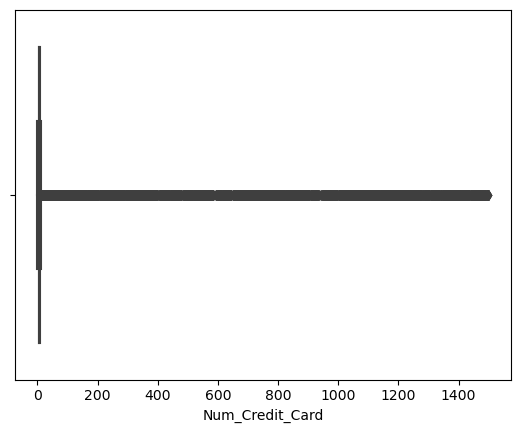

min 0 max 1499


C:\Users\sujan\anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


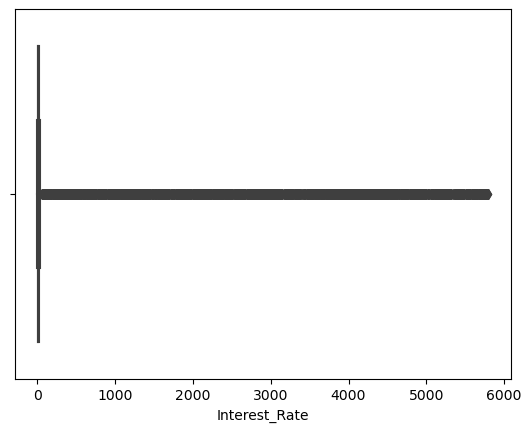

min 1 max 5797


C:\Users\sujan\anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


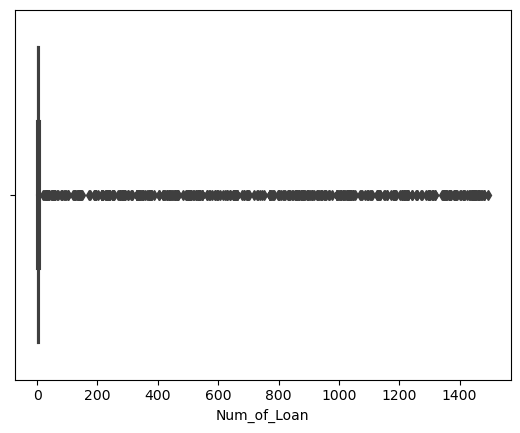

min 1.0 max 1495.0


C:\Users\sujan\anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


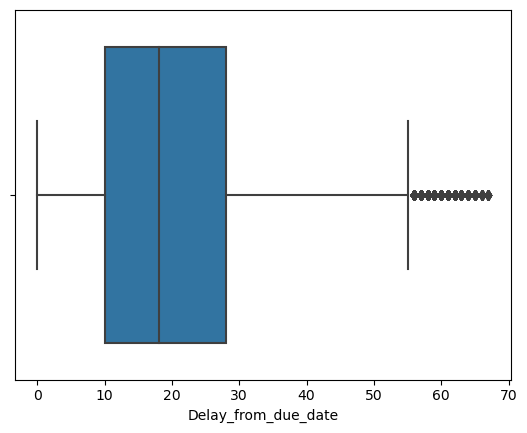

min 0.0 max 67.0


C:\Users\sujan\anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


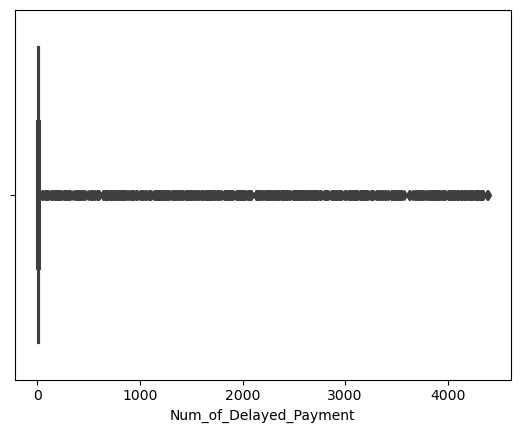

min 0.0 max 4397.0


C:\Users\sujan\anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


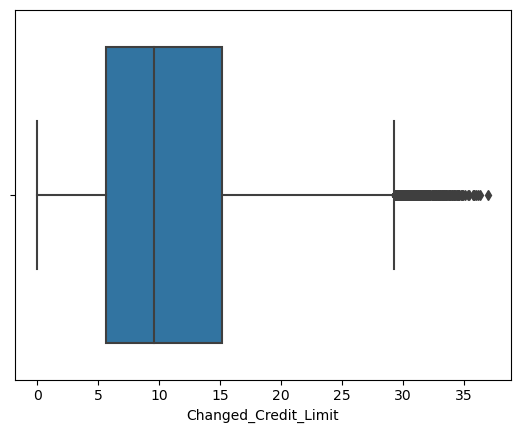

min 0.0 max 36.97


C:\Users\sujan\anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


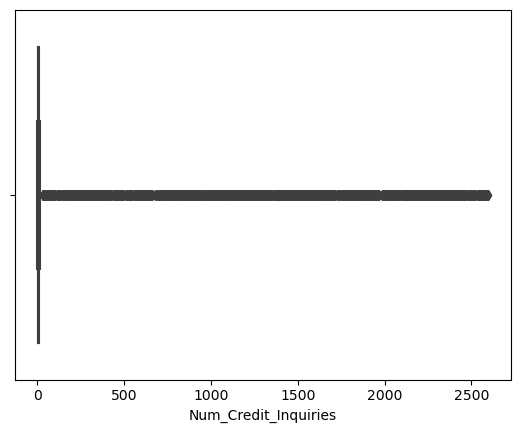

min 0.0 max 2597.0


C:\Users\sujan\anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


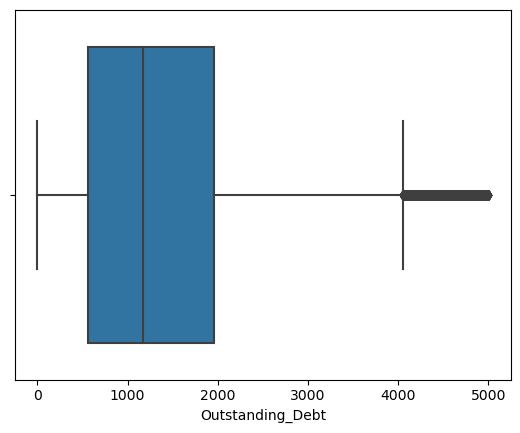

C:\Users\sujan\anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


min 0.34 max 4998.07


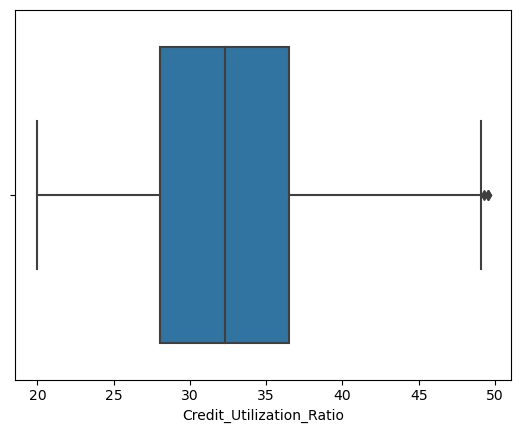

min 20.0 max 49.56


C:\Users\sujan\anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


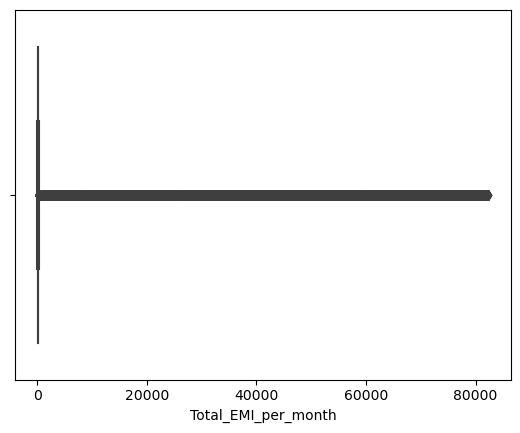

min 0.0 max 82331.0


C:\Users\sujan\anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


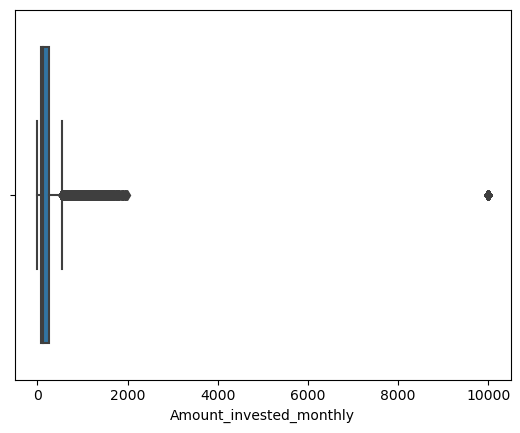

min 0.0 max 10000.0


C:\Users\sujan\anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


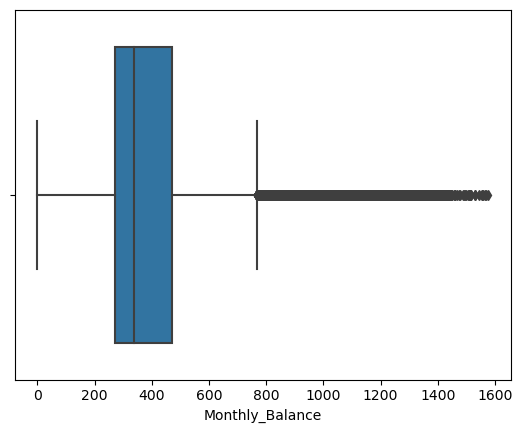

min 0.09 max 1576.29


In [89]:
for i in d1.select_dtypes(include=np.number):
    sns.boxplot(d1[i])
    plt.show()
    print('min',d1[i].min(), 'max',d1[i].max())

In [90]:
q1=d1.quantile(0.25)
q3=d1.quantile(0.75)
iqr=q3-q1
ll=q1-1.5*iqr
ul=q3+1.5*iqr
d1=d1[~((d1 < ll) |(d1 >ul)).any(axis=1)]
d1

C:\Users\sujan\AppData\Local\Temp\ipykernel_26336\2806965592.py:6: FutureWarning: Automatic reindexing on DataFrame vs Series comparisons is deprecated and will raise ValueError in a future version. Do `left, right = left.align(right, axis=1, copy=False)` before e.g. `left == right`
  d1=d1[~((d1 < ll) |(d1 >ul)).any(axis=1)]


,Month,Age,Occupation,Annual_Income,Monthly_Inhand_Salary,Num_Bank_Accounts,Num_Credit_Card,Interest_Rate,Num_of_Loan,Type_of_Loan,Delay_from_due_date,Num_of_Delayed_Payment,Changed_Credit_Limit,Num_Credit_Inquiries,Credit_Mix,Outstanding_Debt,Credit_Utilization_Ratio,Credit_History_Age,Payment_of_Min_Amount,Total_EMI_per_month,Amount_invested_monthly,Payment_Behaviour,Monthly_Balance,Credit_Score
3,April,23.0,Scientist,19114.12,1824.84,3.0,4,3,4.0,"Auto Loan, Credit-Builder Loan, Personal Loan,...",5.0,4.0,6.27,4.0,Good,809.98,31.38,22.4,No,49.57,199.46,Low_spent_Small_value_payments,223.45,Good
5,June,23.0,Scientist,19114.12,1824.84,3.0,4,3,4.0,"Auto Loan, Credit-Builder Loan, Personal Loan,...",8.0,4.0,9.27,4.0,Good,809.98,27.26,22.6,No,49.57,62.43,Low_spent_Small_value_payments,340.48,Good
6,July,23.0,Scientist,19114.12,1824.84,3.0,4,3,4.0,"Auto Loan, Credit-Builder Loan, Personal Loan,...",3.0,8.0,11.27,4.0,Good,809.98,22.54,22.7,No,49.57,178.34,Low_spent_Small_value_payments,244.57,Good
7,August,23.0,Scientist,19114.12,1824.84,3.0,4,3,4.0,"Auto Loan, Credit-Builder Loan, Personal Loan,...",3.0,6.0,11.27,4.0,Good,809.98,23.93,nan,No,49.57,24.79,High_spent_Medium_value_payments,358.12,Standard
9,February,28.0,Teacher,34847.84,3037.99,2.0,4,6,1.0,Credit-Builder Loan,7.0,1.0,7.42,2.0,Good,605.03,38.55,26.8,No,18.82,40.39,High_spent_Large_value_payments,484.59,Good
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
99991,August,29.0,Architect,20002.88,1929.91,10.0,8,29,5.0,"Personal Loan, Auto Loan, Mortgage Loan, Stude...",33.0,25.0,18.31,9.0,Bad,3571.70,37.14,6.3,Yes,60.96,34.66,High_spent_Large_value_payments,337.36,Standard
99994,March,25.0,Mechanic,39628.99,3359.42,4.0,6,7,2.0,"Auto Loan, and Student Loan",20.0,6.0,9.50,3.0,Good,502.38,39.32,31.5,No,35.10,140.58,High_spent_Medium_value_payments,410.26,Poor
99995,April,25.0,Mechanic,39628.99,3359.42,4.0,6,7,2.0,"Auto Loan, and Student Loan",23.0,7.0,11.50,3.0,Good,502.38,34.66,31.6,No,35.10,60.97,High_spent_Large_value_payments,479.87,Poor
99996,May,25.0,Mechanic,39628.99,3359.42,4.0,6,7,2.0,"Auto Loan, and Student Loan",18.0,7.0,11.50,3.0,Good,502.38,40.57,31.7,No,35.10,54.19,High_spent_Medium_value_payments,496.65,Poor


In [91]:
d1.isnull().sum()

Month                       0
Age                         0
Occupation                  0
Annual_Income               0
Monthly_Inhand_Salary       0
Num_Bank_Accounts           0
Num_Credit_Card             0
Interest_Rate               0
Num_of_Loan                 0
Type_of_Loan                0
Delay_from_due_date         0
Num_of_Delayed_Payment      0
Changed_Credit_Limit        0
Num_Credit_Inquiries        0
Credit_Mix                  0
Outstanding_Debt            0
Credit_Utilization_Ratio    0
Credit_History_Age          0
Payment_of_Min_Amount       0
Total_EMI_per_month         0
Amount_invested_monthly     0
Payment_Behaviour           0
Monthly_Balance             0
Credit_Score                0
dtype: int64

In [92]:
ll

Age                             2.00000
Annual_Income              -59809.65500
Monthly_Inhand_Salary       -4820.61250
Num_Bank_Accounts              -2.00000
Num_Credit_Card                -0.50000
Interest_Rate                 -10.00000
Num_of_Loan                    -4.00000
Delay_from_due_date           -17.00000
Num_of_Delayed_Payment         -4.50000
Changed_Credit_Limit           -8.52500
Num_Credit_Inquiries           -6.00000
Outstanding_Debt            -1525.85500
Credit_Utilization_Ratio       15.41500
Total_EMI_per_month          -164.76125
Amount_invested_monthly      -211.84125
Monthly_Balance               -28.93125
dtype: float64

In [93]:
ul

Age                             66.00000
Annual_Income               151318.30500
Monthly_Inhand_Salary        12356.28750
Num_Bank_Accounts               14.00000
Num_Credit_Card                 11.50000
Interest_Rate                   38.00000
Num_of_Loan                     12.00000
Delay_from_due_date             55.00000
Num_of_Delayed_Payment          31.50000
Changed_Credit_Limit            29.27500
Num_Credit_Inquiries            18.00000
Outstanding_Debt              4052.26500
Credit_Utilization_Ratio        49.13500
Total_EMI_per_month            355.60875
Amount_invested_monthly        549.78875
Monthly_Balance                767.89875
dtype: float64

C:\Users\sujan\anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


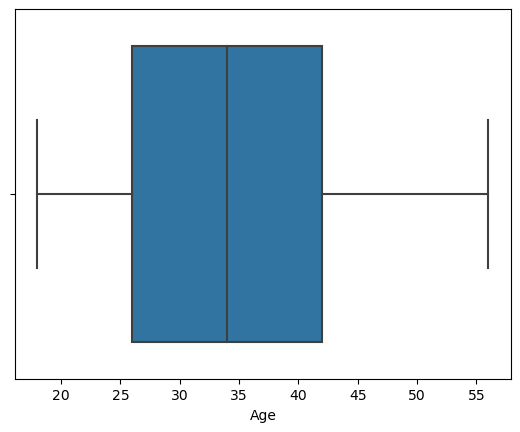

min 18.0 max 56.0
0.2284433786849739


C:\Users\sujan\anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


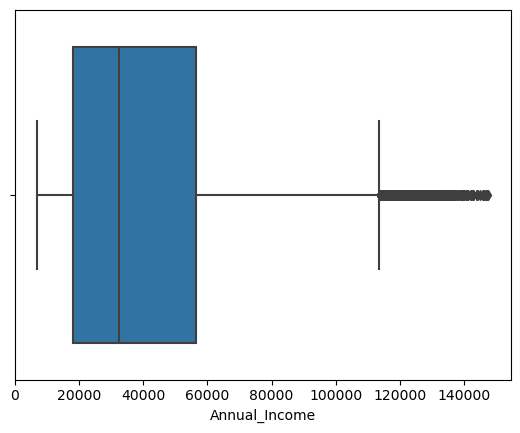

min 7006.04 max 147499.6
1.0812129991026718


C:\Users\sujan\anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


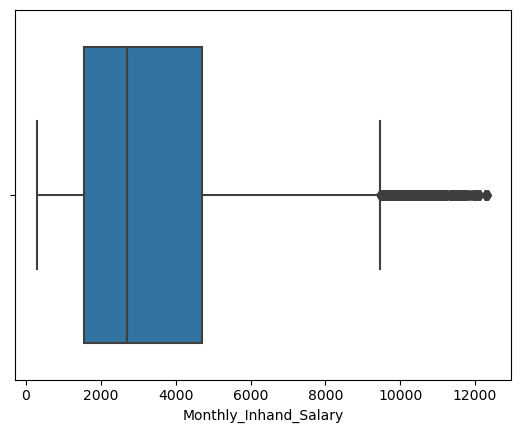

min 303.65 max 12353.63
1.0792024987832947


C:\Users\sujan\anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


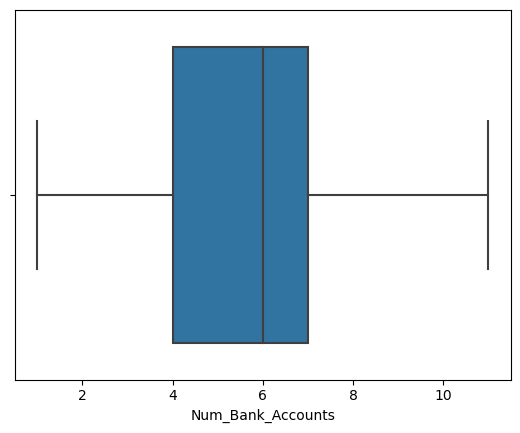

C:\Users\sujan\anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


min 1.0 max 11.0
0.009929569408336019


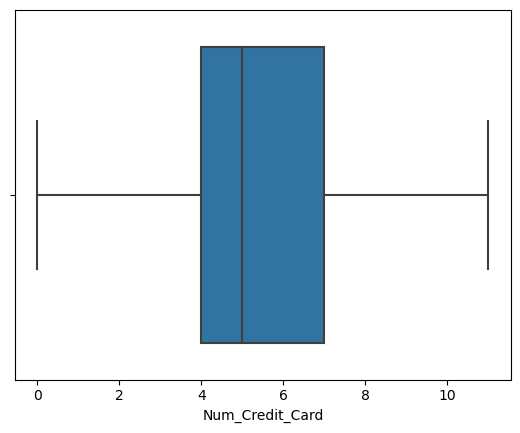

min 0 max 11
0.2586093253867433


C:\Users\sujan\anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


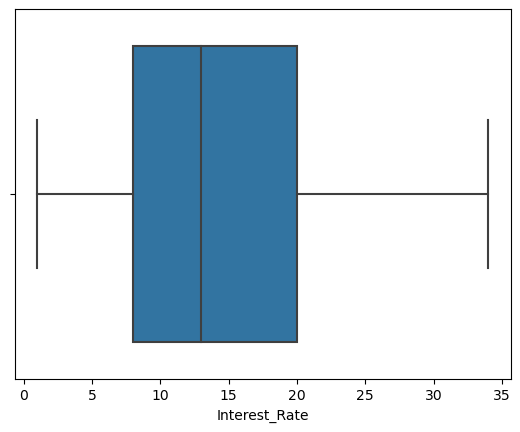

min 1 max 34
0.5202870234268674


C:\Users\sujan\anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


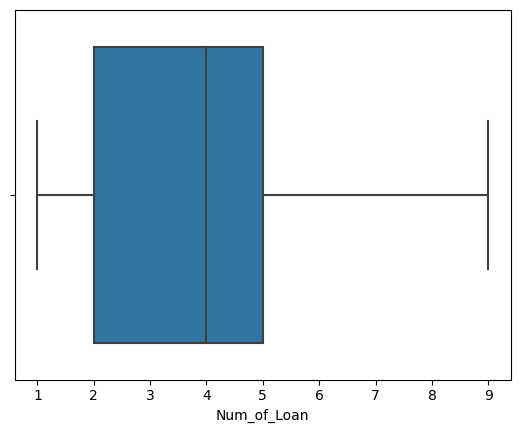

min 1.0 max 9.0
0.6151713557978145


C:\Users\sujan\anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


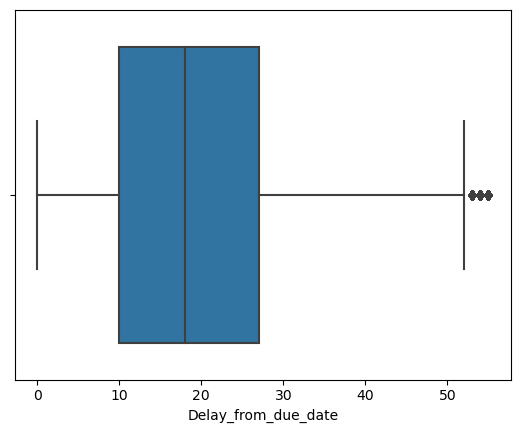

min 0.0 max 55.0
0.8264862165405561


C:\Users\sujan\anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


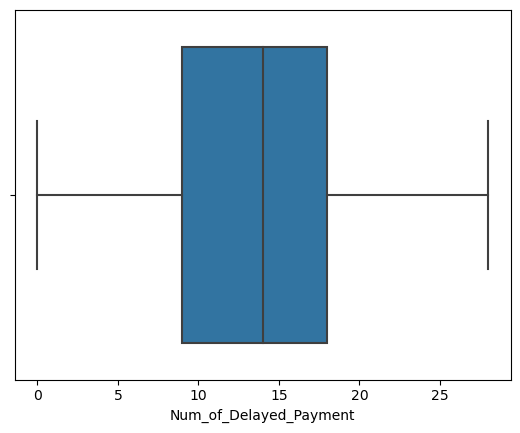

min 0.0 max 28.0
-0.19234885156502451


C:\Users\sujan\anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


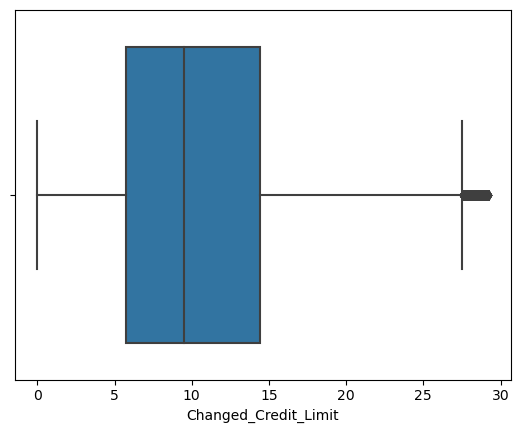

min 0.0 max 29.21
0.5767028786659485


C:\Users\sujan\anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


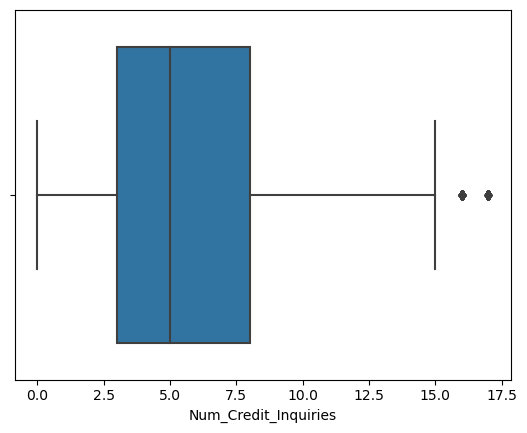

min 0.0 max 17.0
0.4152513862224158


C:\Users\sujan\anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


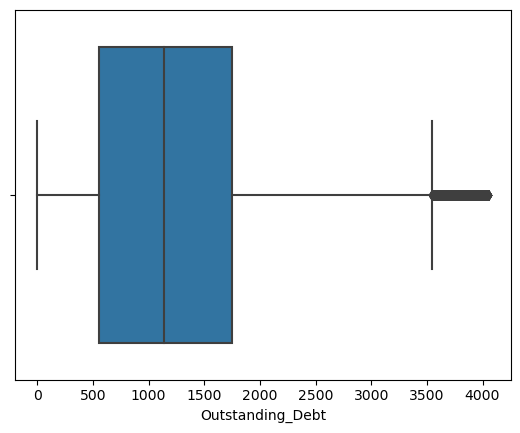

min 0.54 max 4051.83
0.8897194905680399


C:\Users\sujan\anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


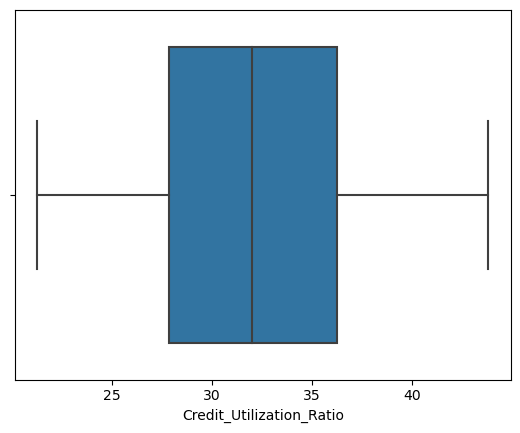

min 21.26 max 43.82
0.003496560076062659


C:\Users\sujan\anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


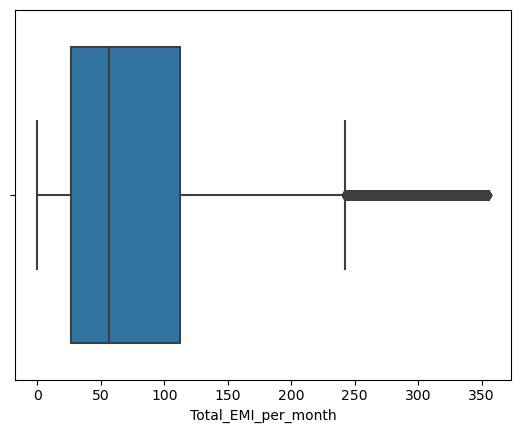

min 0.0 max 355.35
1.3460172509258594


C:\Users\sujan\anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


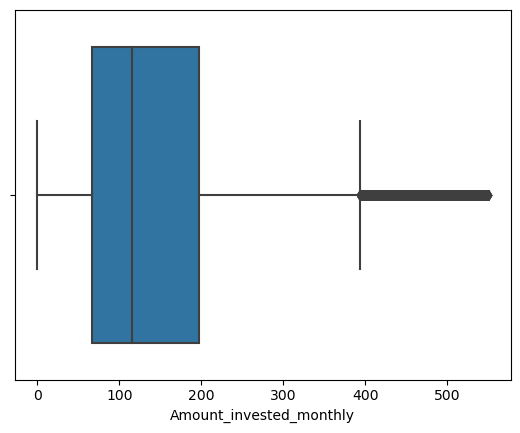

min 0.0 max 549.77
1.3602119314749979


C:\Users\sujan\anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


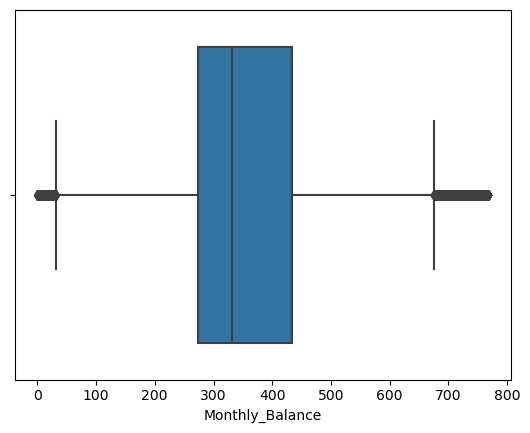

min 0.09 max 767.87
0.8801228524086079


In [94]:
for i in d1.select_dtypes(include=np.number):
    sns.boxplot(d1[i])
    plt.show()
    print('min',d1[i].min(), 'max',d1[i].max())
    print(d1[i].skew())

In [95]:
d1.shape

(45946, 24)

In [96]:
(d1["Credit_Score"].value_counts(normalize=True).sort_index())*100

Good        15.803334
Poor        28.655378
Standard    55.541288
Name: Credit_Score, dtype: float64

# Univariate Analysis

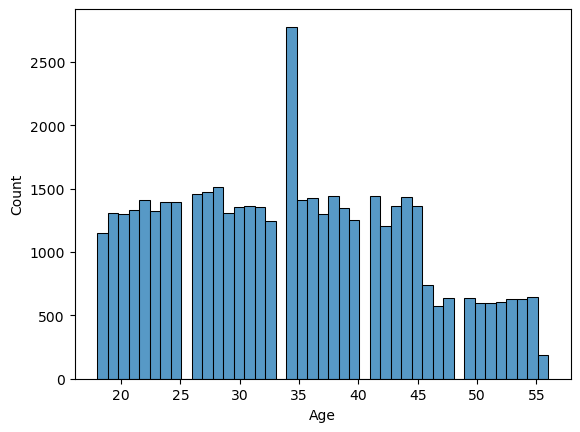

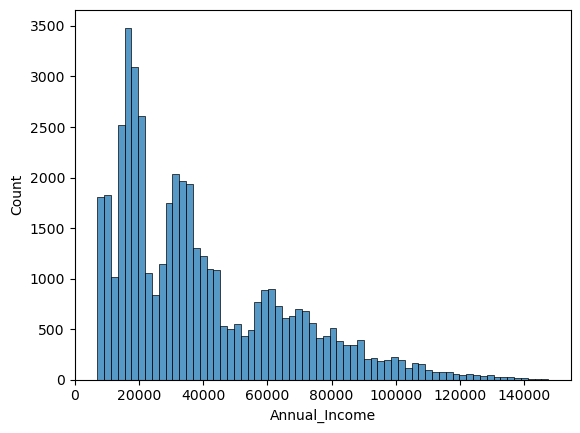

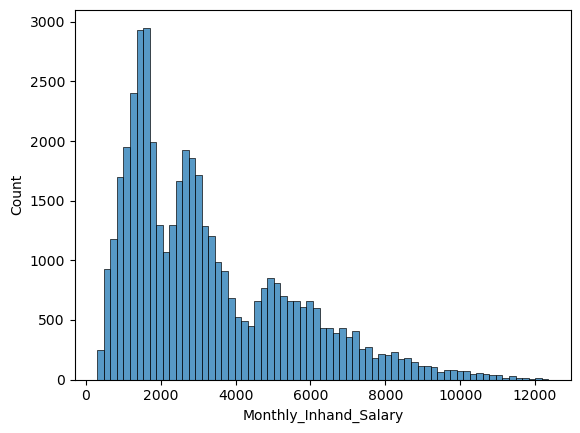

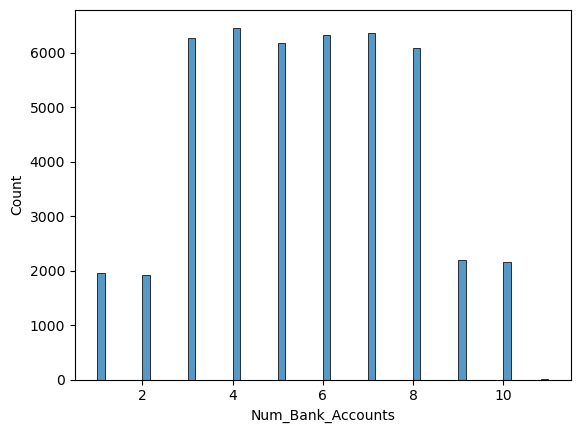

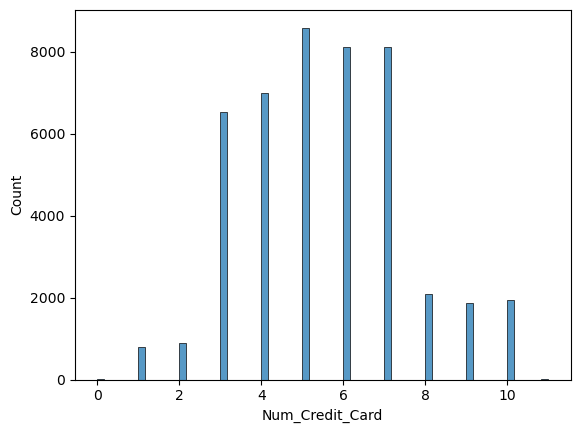

...

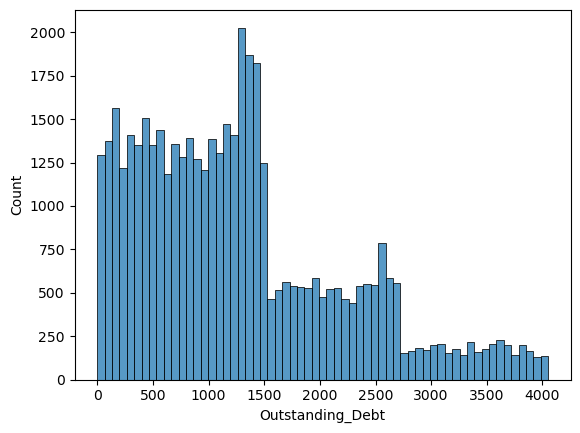

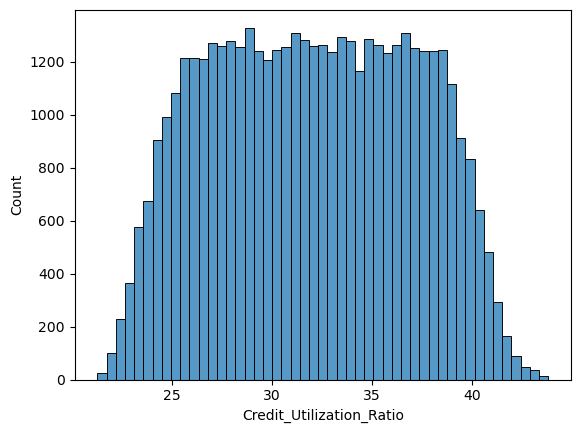

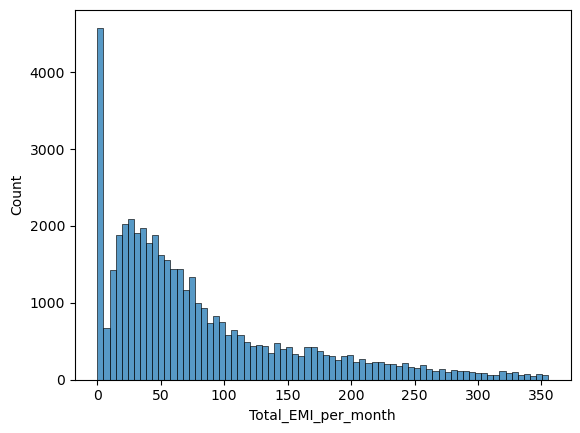

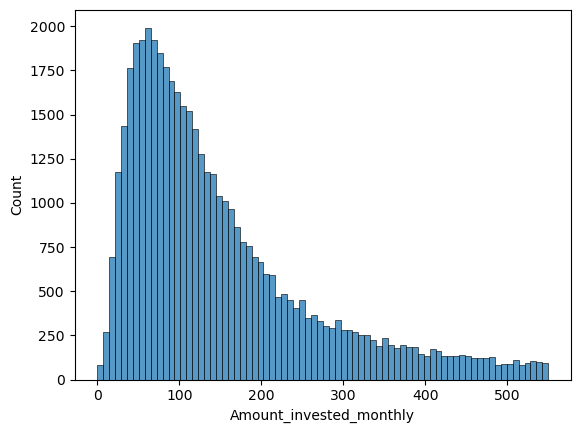

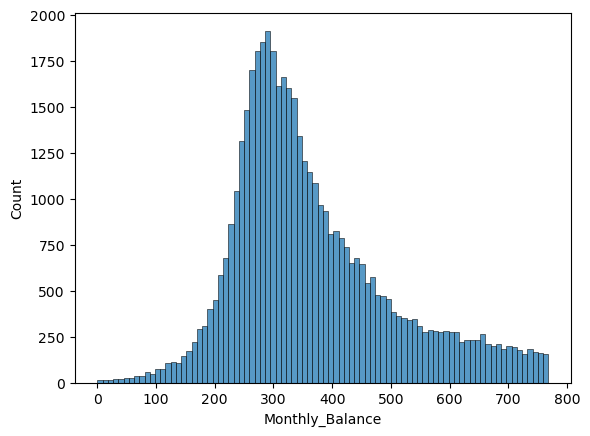

In [97]:
for i in d1.select_dtypes(include=np.number):
    sns.histplot(d1[i])
    plt.show()

C:\Users\sujan\anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


<AxesSubplot:xlabel='Credit_Score', ylabel='count'>

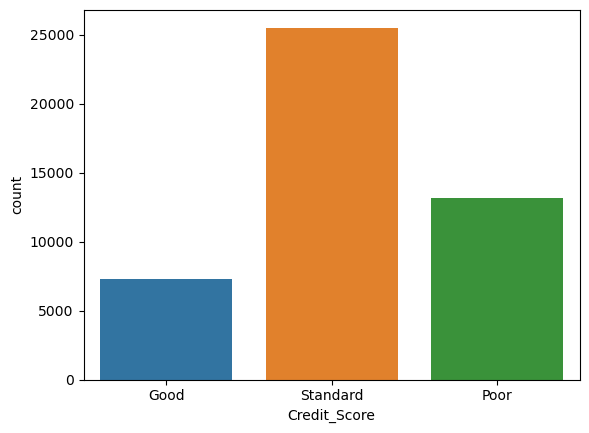

In [98]:
sns.countplot(d1['Credit_Score'])

<AxesSubplot:xlabel='Month', ylabel='count'>

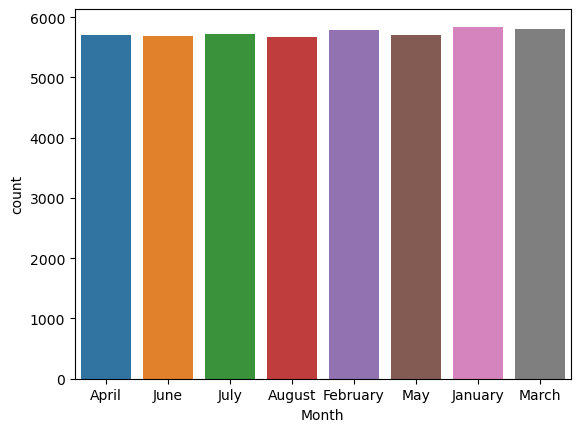

In [99]:
sns.countplot(x=d1["Month"])

In [100]:
d1

,Month,Age,Occupation,Annual_Income,Monthly_Inhand_Salary,Num_Bank_Accounts,Num_Credit_Card,Interest_Rate,Num_of_Loan,Type_of_Loan,Delay_from_due_date,Num_of_Delayed_Payment,Changed_Credit_Limit,Num_Credit_Inquiries,Credit_Mix,Outstanding_Debt,Credit_Utilization_Ratio,Credit_History_Age,Payment_of_Min_Amount,Total_EMI_per_month,Amount_invested_monthly,Payment_Behaviour,Monthly_Balance,Credit_Score
3,April,23.0,Scientist,19114.12,1824.84,3.0,4,3,4.0,"Auto Loan, Credit-Builder Loan, Personal Loan,...",5.0,4.0,6.27,4.0,Good,809.98,31.38,22.4,No,49.57,199.46,Low_spent_Small_value_payments,223.45,Good
5,June,23.0,Scientist,19114.12,1824.84,3.0,4,3,4.0,"Auto Loan, Credit-Builder Loan, Personal Loan,...",8.0,4.0,9.27,4.0,Good,809.98,27.26,22.6,No,49.57,62.43,Low_spent_Small_value_payments,340.48,Good
6,July,23.0,Scientist,19114.12,1824.84,3.0,4,3,4.0,"Auto Loan, Credit-Builder Loan, Personal Loan,...",3.0,8.0,11.27,4.0,Good,809.98,22.54,22.7,No,49.57,178.34,Low_spent_Small_value_payments,244.57,Good
7,August,23.0,Scientist,19114.12,1824.84,3.0,4,3,4.0,"Auto Loan, Credit-Builder Loan, Personal Loan,...",3.0,6.0,11.27,4.0,Good,809.98,23.93,nan,No,49.57,24.79,High_spent_Medium_value_payments,358.12,Standard
9,February,28.0,Teacher,34847.84,3037.99,2.0,4,6,1.0,Credit-Builder Loan,7.0,1.0,7.42,2.0,Good,605.03,38.55,26.8,No,18.82,40.39,High_spent_Large_value_payments,484.59,Good
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
99991,August,29.0,Architect,20002.88,1929.91,10.0,8,29,5.0,"Personal Loan, Auto Loan, Mortgage Loan, Stude...",33.0,25.0,18.31,9.0,Bad,3571.70,37.14,6.3,Yes,60.96,34.66,High_spent_Large_value_payments,337.36,Standard
99994,March,25.0,Mechanic,39628.99,3359.42,4.0,6,7,2.0,"Auto Loan, and Student Loan",20.0,6.0,9.50,3.0,Good,502.38,39.32,31.5,No,35.10,140.58,High_spent_Medium_value_payments,410.26,Poor
99995,April,25.0,Mechanic,39628.99,3359.42,4.0,6,7,2.0,"Auto Loan, and Student Loan",23.0,7.0,11.50,3.0,Good,502.38,34.66,31.6,No,35.10,60.97,High_spent_Large_value_payments,479.87,Poor
99996,May,25.0,Mechanic,39628.99,3359.42,4.0,6,7,2.0,"Auto Loan, and Student Loan",18.0,7.0,11.50,3.0,Good,502.38,40.57,31.7,No,35.10,54.19,High_spent_Medium_value_payments,496.65,Poor


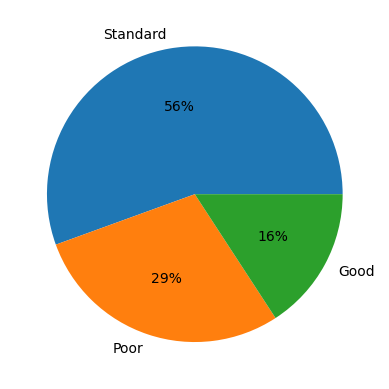

In [101]:
def target_ratio(df=d1,target='Credit_Score'):

    if not target:
        plt.pie(df.value_counts(),labels=df.value_counts()
                .index,autopct='%.0f%%')

    else:
        plt.pie(df[target].value_counts(),labels=df[target]
                .value_counts().index,autopct='%.0f%%')

target_ratio()

<AxesSubplot:xlabel='Occupation', ylabel='count'>

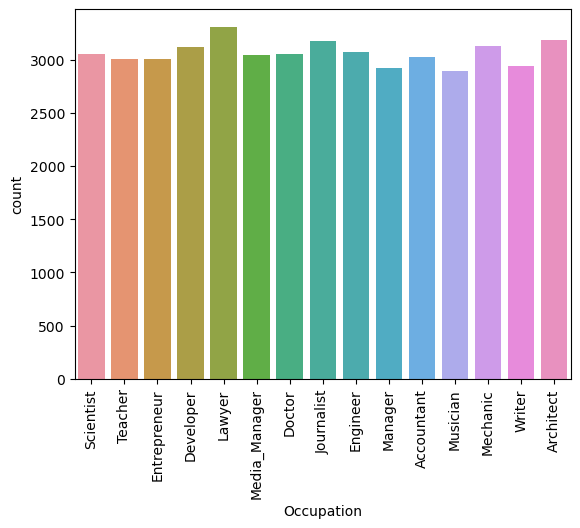

In [102]:
plt.xticks(rotation=90)
sns.countplot(x=d1["Occupation"])

<AxesSubplot:xlabel='Credit_Mix', ylabel='count'>

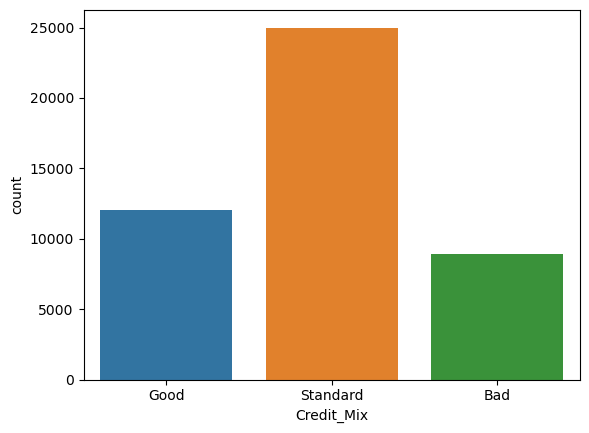

In [103]:
sns.countplot(x=d1["Credit_Mix"])

C:\Users\sujan\anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


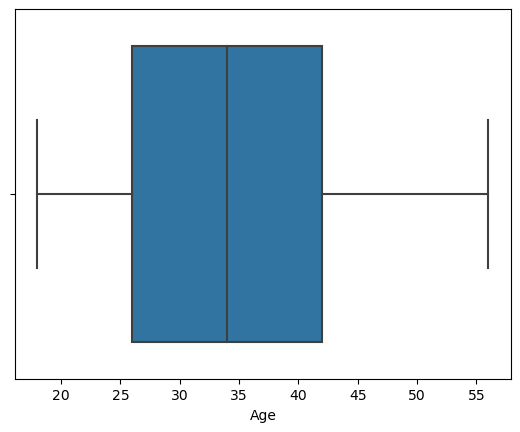

C:\Users\sujan\anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


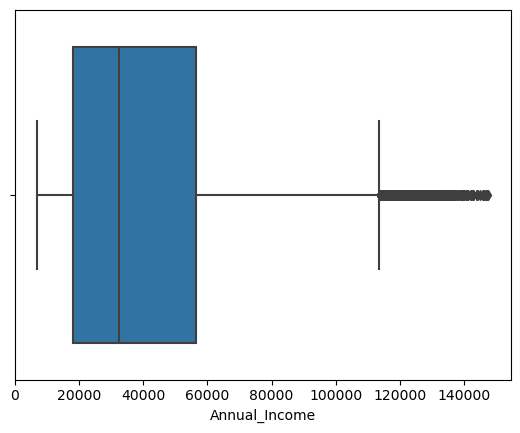

C:\Users\sujan\anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


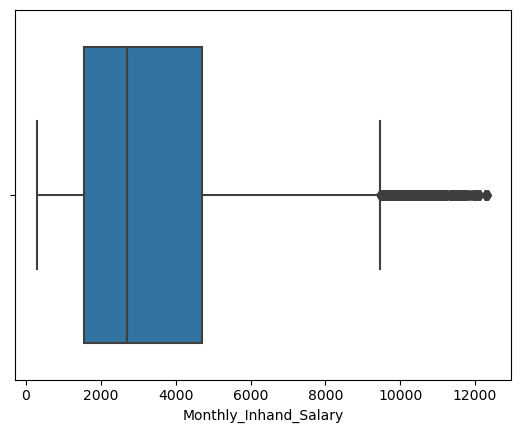

C:\Users\sujan\anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


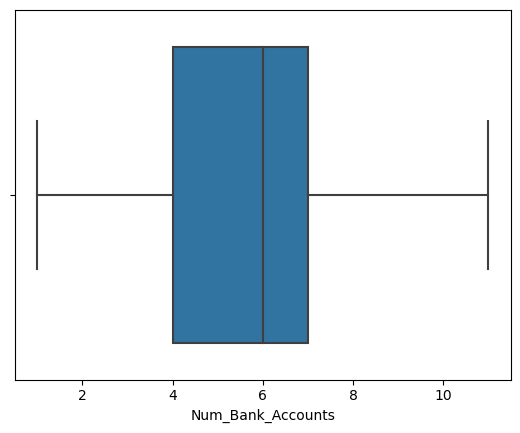

C:\Users\sujan\anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


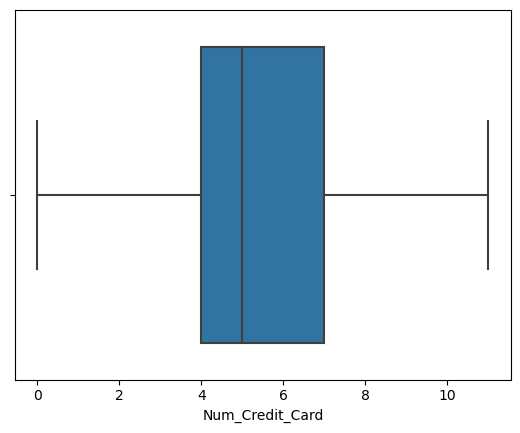

C:\Users\sujan\anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


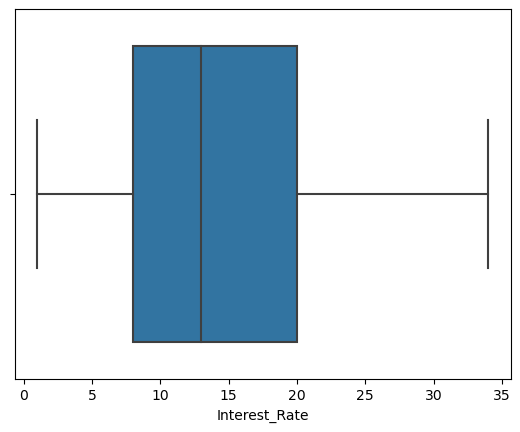

C:\Users\sujan\anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


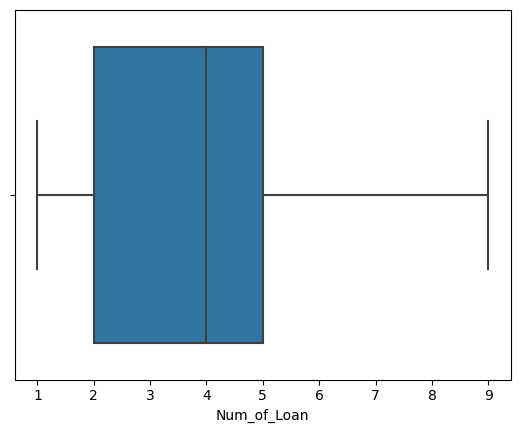

C:\Users\sujan\anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


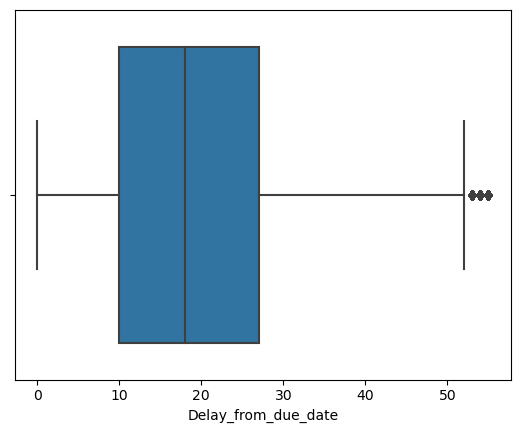

C:\Users\sujan\anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


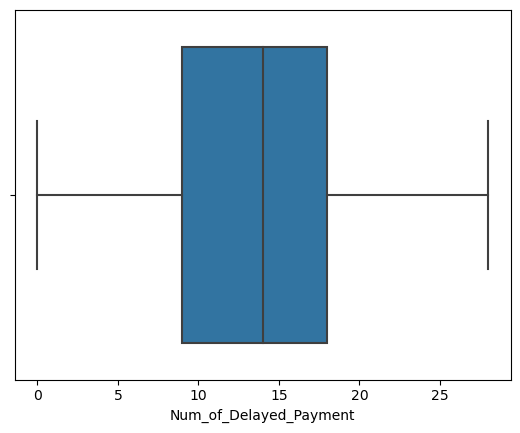

C:\Users\sujan\anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


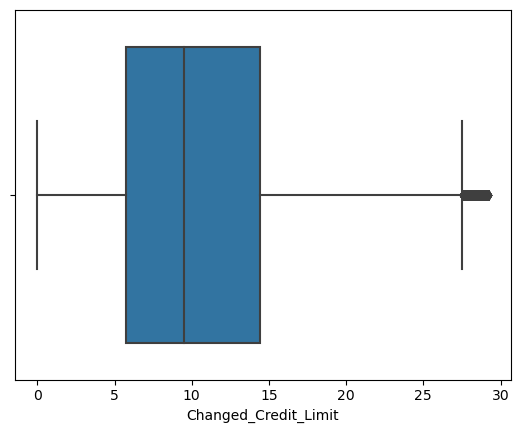

C:\Users\sujan\anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


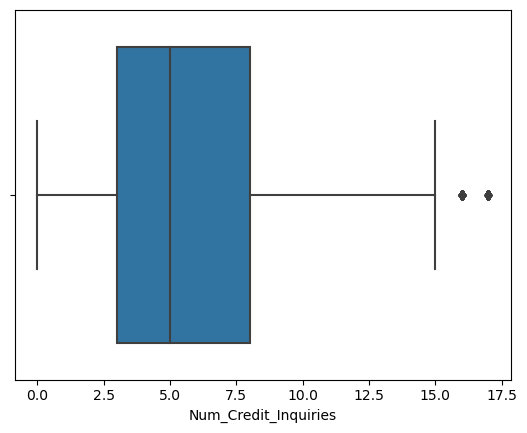

C:\Users\sujan\anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


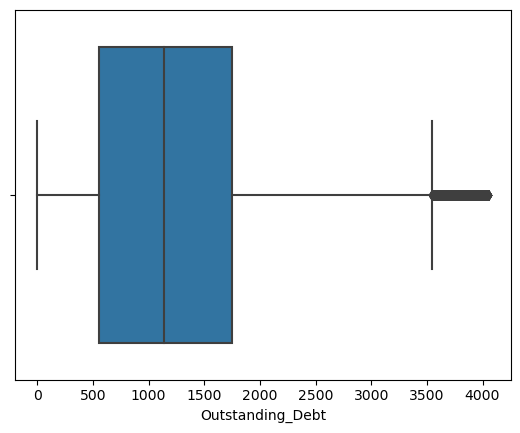

C:\Users\sujan\anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


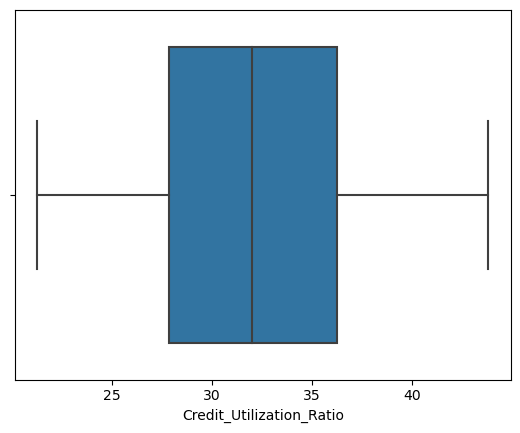

C:\Users\sujan\anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


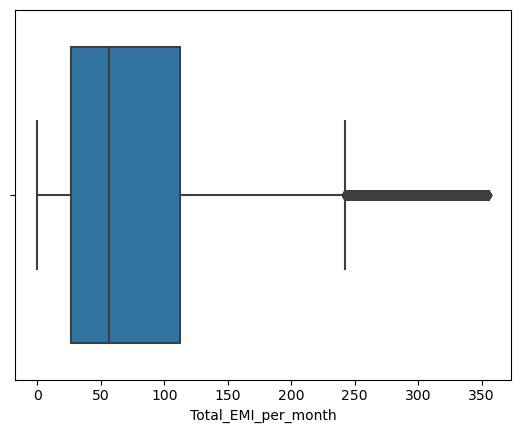

C:\Users\sujan\anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


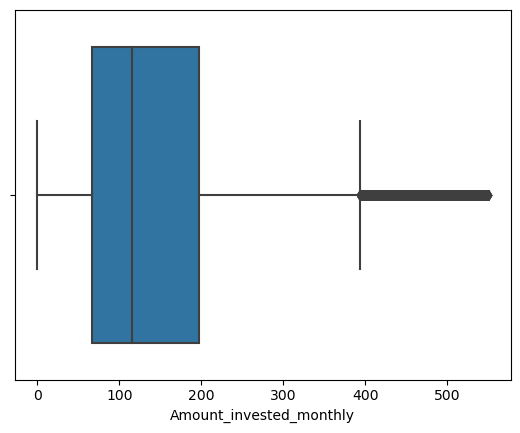

C:\Users\sujan\anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


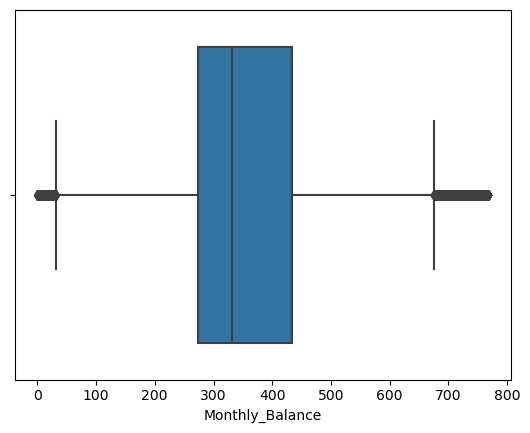

In [104]:
for i in d1.select_dtypes(include=np.number):
    sns.boxplot(d1[i])
    plt.show()

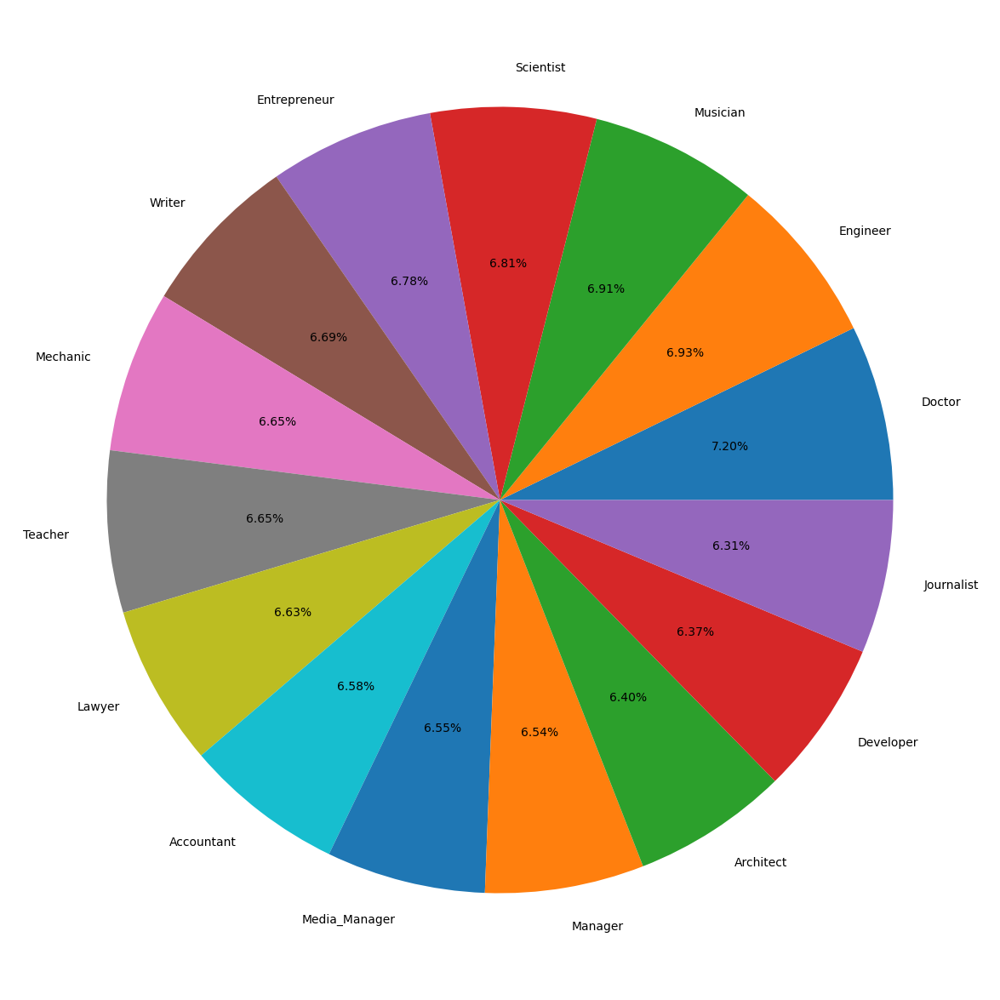

In [105]:
Occupation = d1['Occupation'].value_counts().tolist()
labels = d1['Occupation'].values.tolist()
labels = list(set(labels))
plt.figure(figsize = (15,15))
plt.pie(Occupation, labels = labels, autopct = '%1.2f%%')
plt.show()

In [106]:
d1.select_dtypes('object').describe().T

,count,unique,top,freq
Month,45946,8,January,5842
Occupation,45946,15,Lawyer,3310
Type_of_Loan,45946,4699,Not_Specified,4665
Credit_Mix,45946,3,Standard,24996
Credit_History_Age,45946,405,nan,4198
Payment_of_Min_Amount,45946,3,Yes,24956
Payment_Behaviour,45946,6,Low_spent_Small_value_payments,15909
Credit_Score,45946,3,Standard,25519


# Multicollinearity Treatment

<AxesSubplot:>

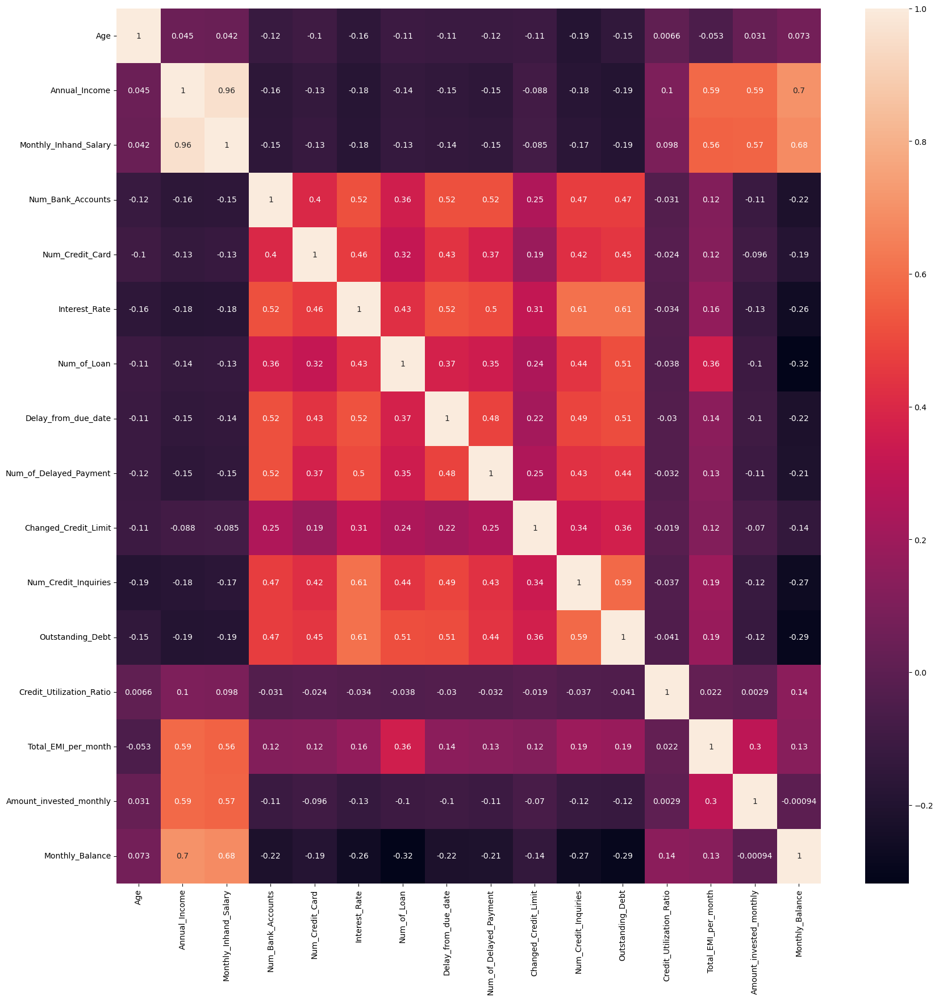

In [107]:
plt.figure(figsize=(20,20))
sns.heatmap(d1.corr(), annot=True)

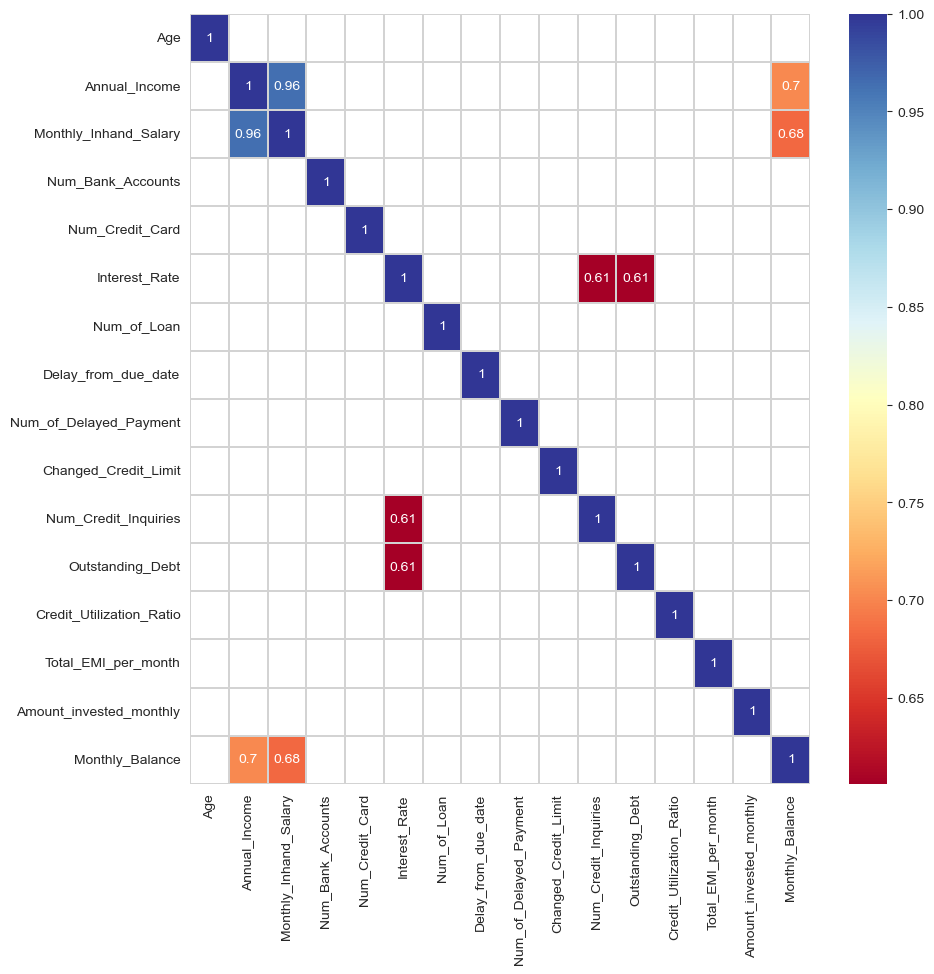

In [108]:
threshold = 0.6
plt.figure(figsize=(10,10))

sns.set_style("whitegrid", {"axes.facecolor": ".0"})
df_cluster2 = d1.corr()
mask = df_cluster2.where((abs(df_cluster2) >= threshold)).isna()
plot_kws={"s": 1}
sns.heatmap(df_cluster2,
            cmap='RdYlBu',
            annot=True,
            mask=mask,
            linewidths=0.2, 
            linecolor='lightgrey').set_facecolor('white')

'Monthly_Balance', 'Annual_Income', 'Monthly_Inhand_Salary' has correlation among each other., so we are dropping certain columns

In [110]:
d1.drop(columns=['Monthly_Balance'], inplace=True)

C:\Users\sujan\AppData\Local\Temp\ipykernel_26336\2954935843.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  d1.drop(columns=['Monthly_Balance'], inplace=True)


In [111]:
d1.drop(columns=['Monthly_Inhand_Salary'], inplace=True)

C:\Users\sujan\AppData\Local\Temp\ipykernel_26336\3532992228.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  d1.drop(columns=['Monthly_Inhand_Salary'], inplace=True)


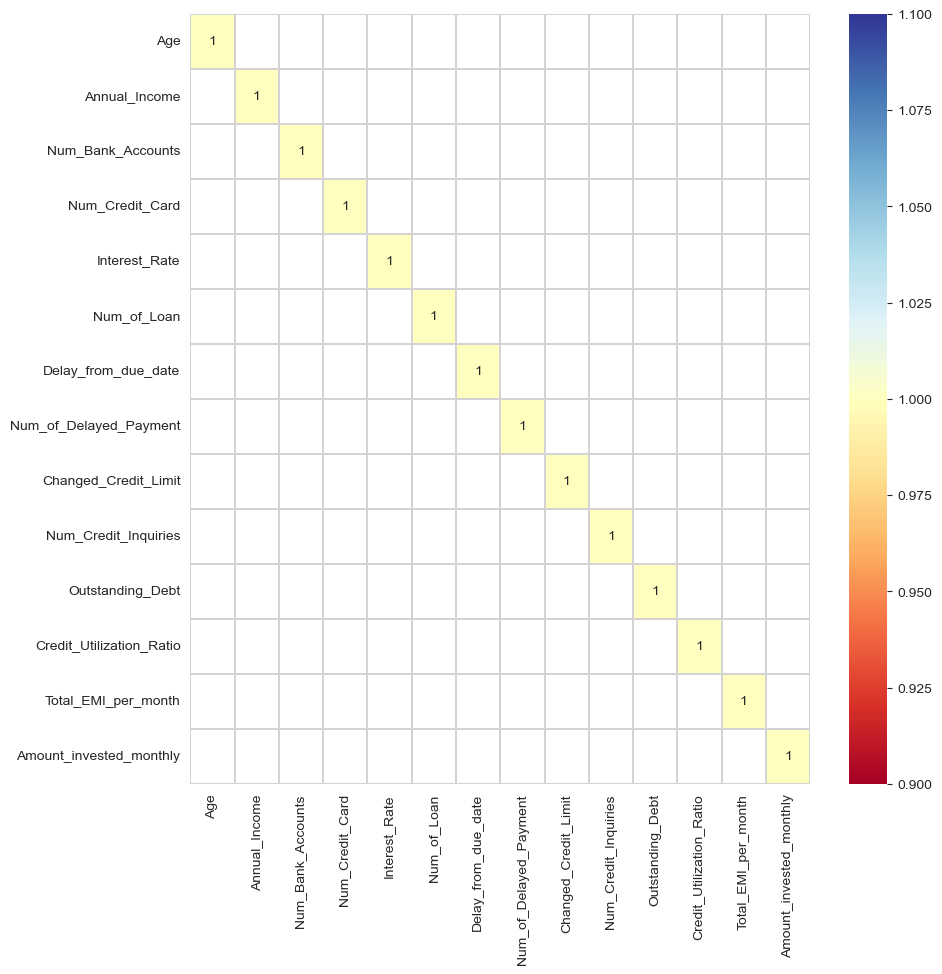

In [114]:
threshold = 0.63
plt.figure(figsize=(10,10))

sns.set_style("whitegrid", {"axes.facecolor": ".0"})
df_cluster2 = d1.corr()
mask = df_cluster2.where((abs(df_cluster2) >= threshold)).isna()
plot_kws={"s": 1}
sns.heatmap(df_cluster2,
            cmap='RdYlBu',
            annot=True,
            mask=mask,
            linewidths=0.2, 
            linecolor='lightgrey').set_facecolor('white')

In [115]:
#now dataset free of multicollinearity

In [116]:
del d1['Payment_Behaviour']

In [117]:
del d1['Type_of_Loan']

In [118]:
d1

,Month,Age,Occupation,Annual_Income,Num_Bank_Accounts,Num_Credit_Card,Interest_Rate,Num_of_Loan,Delay_from_due_date,Num_of_Delayed_Payment,Changed_Credit_Limit,Num_Credit_Inquiries,Credit_Mix,Outstanding_Debt,Credit_Utilization_Ratio,Credit_History_Age,Payment_of_Min_Amount,Total_EMI_per_month,Amount_invested_monthly,Credit_Score
3,April,23.0,Scientist,19114.12,3.0,4,3,4.0,5.0,4.0,6.27,4.0,Good,809.98,31.38,22.4,No,49.57,199.46,Good
5,June,23.0,Scientist,19114.12,3.0,4,3,4.0,8.0,4.0,9.27,4.0,Good,809.98,27.26,22.6,No,49.57,62.43,Good
6,July,23.0,Scientist,19114.12,3.0,4,3,4.0,3.0,8.0,11.27,4.0,Good,809.98,22.54,22.7,No,49.57,178.34,Good
7,August,23.0,Scientist,19114.12,3.0,4,3,4.0,3.0,6.0,11.27,4.0,Good,809.98,23.93,nan,No,49.57,24.79,Standard
9,February,28.0,Teacher,34847.84,2.0,4,6,1.0,7.0,1.0,7.42,2.0,Good,605.03,38.55,26.8,No,18.82,40.39,Good
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
99991,August,29.0,Architect,20002.88,10.0,8,29,5.0,33.0,25.0,18.31,9.0,Bad,3571.70,37.14,6.3,Yes,60.96,34.66,Standard
99994,March,25.0,Mechanic,39628.99,4.0,6,7,2.0,20.0,6.0,9.50,3.0,Good,502.38,39.32,31.5,No,35.10,140.58,Poor
99995,April,25.0,Mechanic,39628.99,4.0,6,7,2.0,23.0,7.0,11.50,3.0,Good,502.38,34.66,31.6,No,35.10,60.97,Poor
99996,May,25.0,Mechanic,39628.99,4.0,6,7,2.0,18.0,7.0,11.50,3.0,Good,502.38,40.57,31.7,No,35.10,54.19,Poor


# Bivariate and Multi-Variate Analysis

<AxesSubplot:>

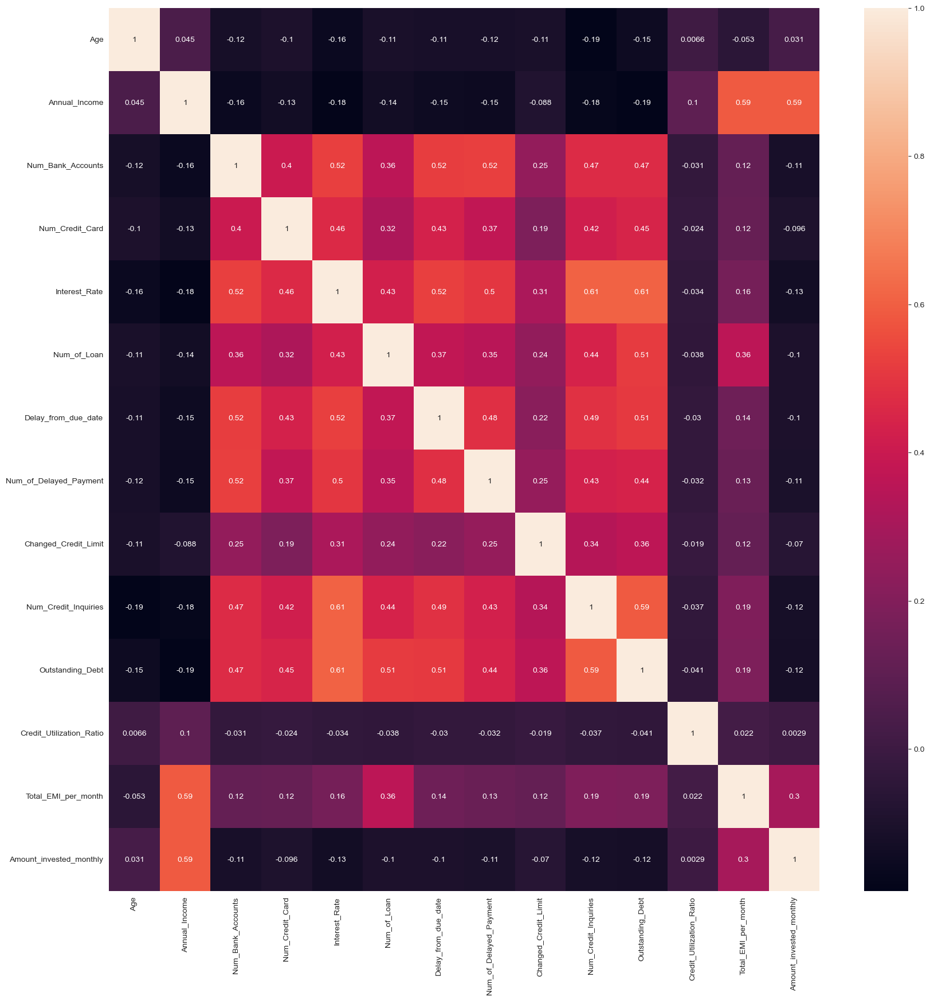

In [119]:
plt.figure(figsize=(20,20))
sns.heatmap(d1.corr(), annot=True)

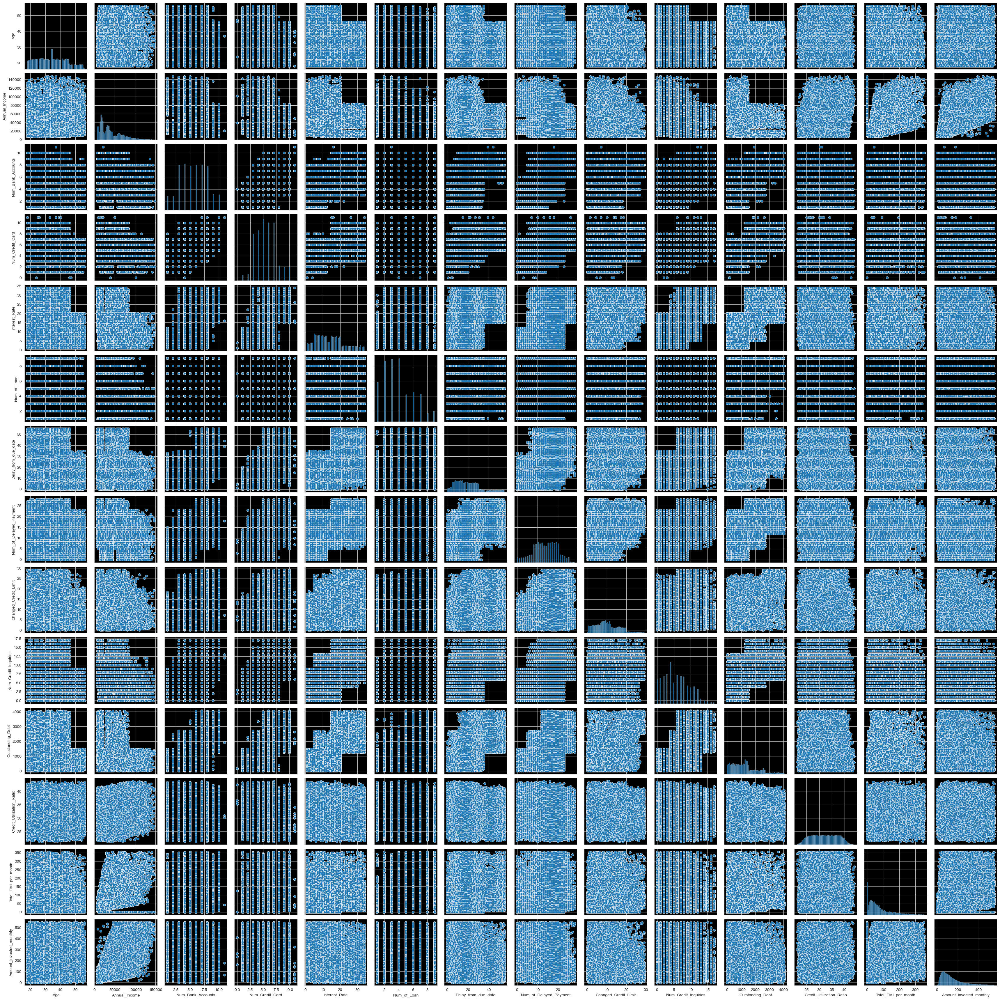

In [120]:
sns.pairplot(d1)

<Figure size 2000x2000 with 0 Axes>

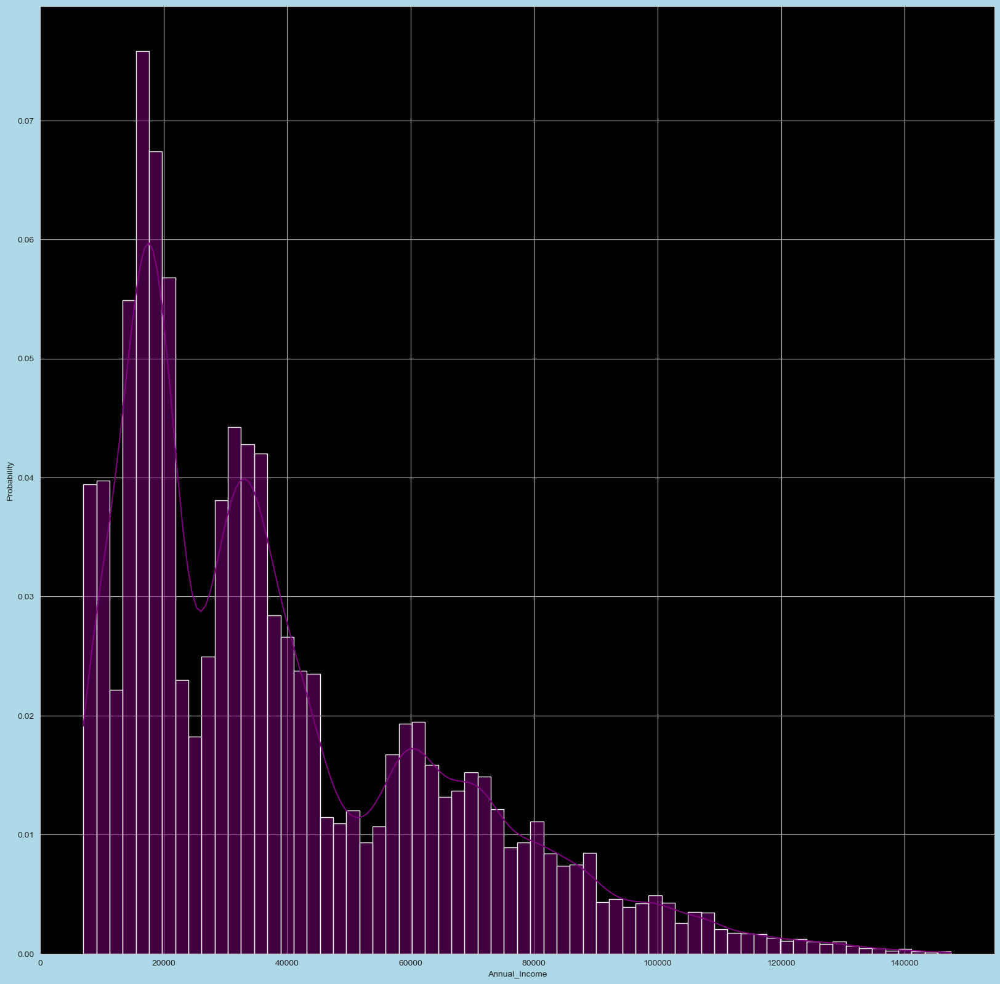

In [121]:
plt.figure(figsize = (20,20))
plt.figure(figsize=(20, 20), facecolor='lightblue')
sns.histplot(data = d1, x = 'Annual_Income', kde = True, stat = 'probability',color='purple')
plt.show()

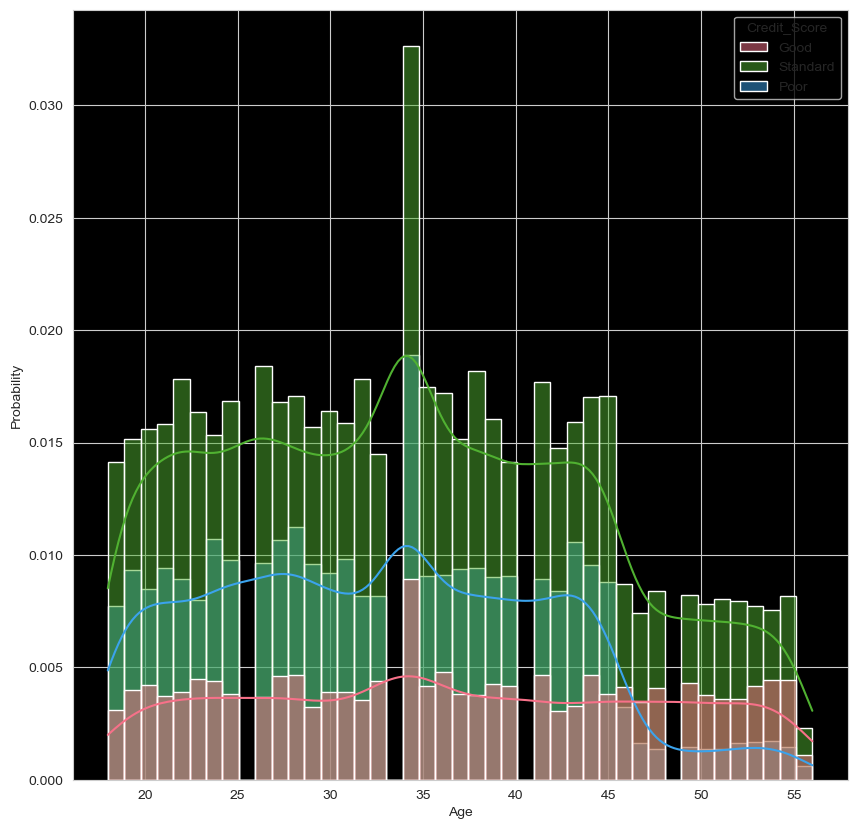

In [122]:
plt.figure(figsize = (10,10))
sns.histplot(data = d1, x = 'Age', hue = 'Credit_Score', kde = True, stat = 'probability', palette = 'husl')
plt.show()

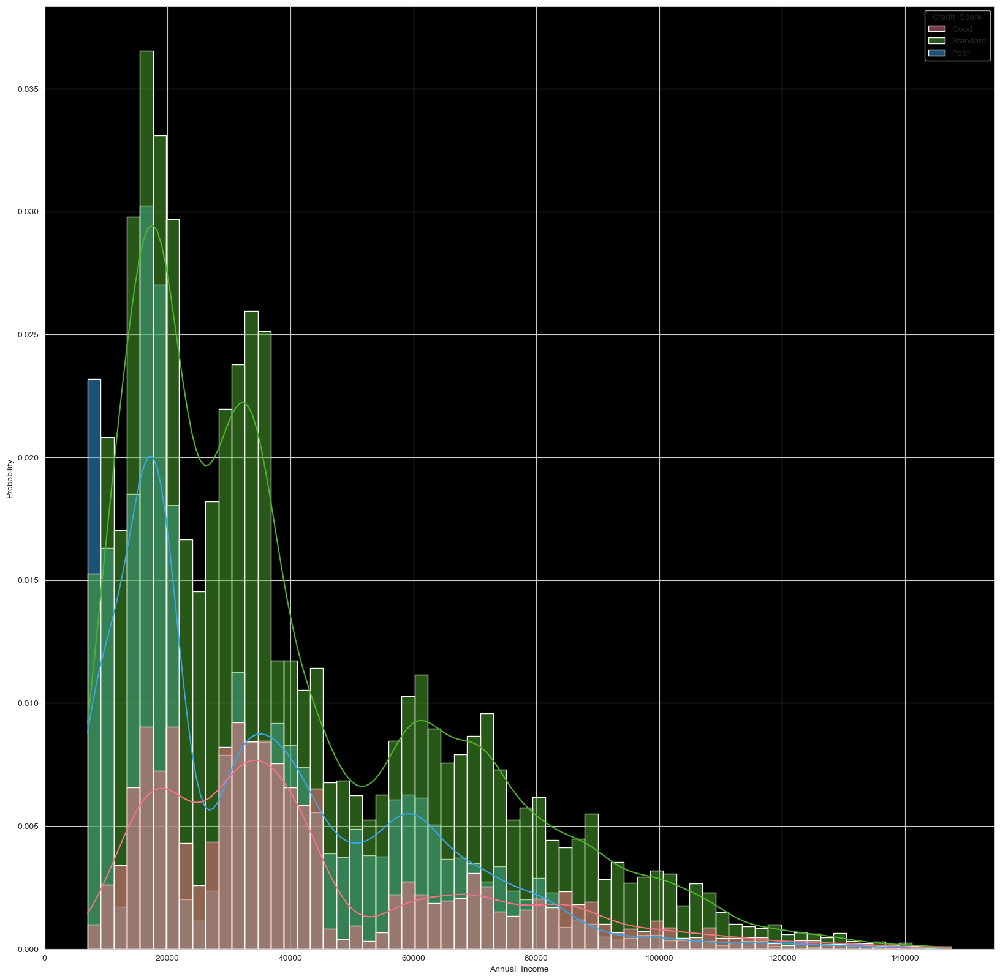

In [123]:
plt.figure(figsize = (20,20))
sns.histplot(data = d1, x = 'Annual_Income', hue = 'Credit_Score', kde = True, stat = 'probability', palette = 'husl')
plt.show()

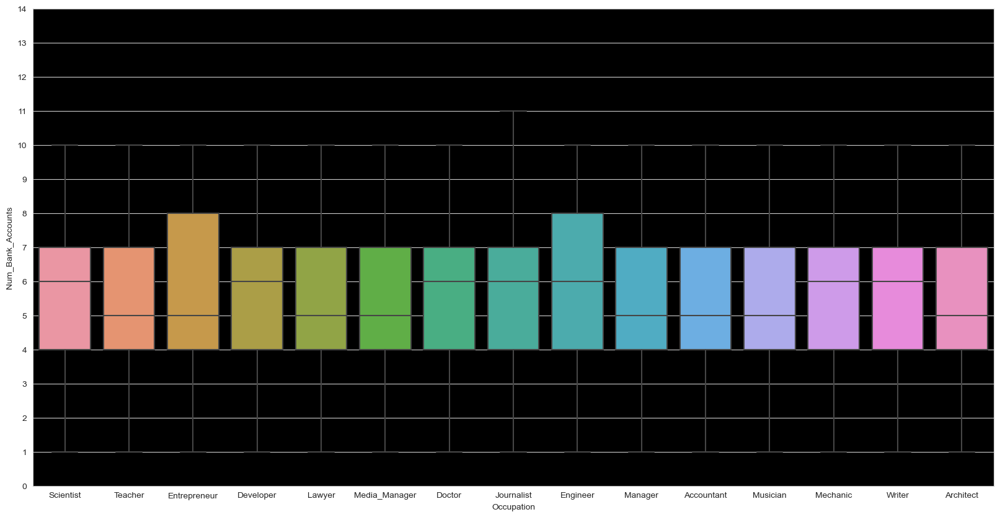

In [124]:
plt.figure(figsize = (20, 10), dpi = 100)
sns.boxplot(data = d1, x = 'Occupation', y = 'Num_Bank_Accounts')
plt.yticks(np.arange(0, 15))
plt.show()

In [125]:
d1

,Month,Age,Occupation,Annual_Income,Num_Bank_Accounts,Num_Credit_Card,Interest_Rate,Num_of_Loan,Delay_from_due_date,Num_of_Delayed_Payment,Changed_Credit_Limit,Num_Credit_Inquiries,Credit_Mix,Outstanding_Debt,Credit_Utilization_Ratio,Credit_History_Age,Payment_of_Min_Amount,Total_EMI_per_month,Amount_invested_monthly,Credit_Score
3,April,23.0,Scientist,19114.12,3.0,4,3,4.0,5.0,4.0,6.27,4.0,Good,809.98,31.38,22.4,No,49.57,199.46,Good
5,June,23.0,Scientist,19114.12,3.0,4,3,4.0,8.0,4.0,9.27,4.0,Good,809.98,27.26,22.6,No,49.57,62.43,Good
6,July,23.0,Scientist,19114.12,3.0,4,3,4.0,3.0,8.0,11.27,4.0,Good,809.98,22.54,22.7,No,49.57,178.34,Good
7,August,23.0,Scientist,19114.12,3.0,4,3,4.0,3.0,6.0,11.27,4.0,Good,809.98,23.93,nan,No,49.57,24.79,Standard
9,February,28.0,Teacher,34847.84,2.0,4,6,1.0,7.0,1.0,7.42,2.0,Good,605.03,38.55,26.8,No,18.82,40.39,Good
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
99991,August,29.0,Architect,20002.88,10.0,8,29,5.0,33.0,25.0,18.31,9.0,Bad,3571.70,37.14,6.3,Yes,60.96,34.66,Standard
99994,March,25.0,Mechanic,39628.99,4.0,6,7,2.0,20.0,6.0,9.50,3.0,Good,502.38,39.32,31.5,No,35.10,140.58,Poor
99995,April,25.0,Mechanic,39628.99,4.0,6,7,2.0,23.0,7.0,11.50,3.0,Good,502.38,34.66,31.6,No,35.10,60.97,Poor
99996,May,25.0,Mechanic,39628.99,4.0,6,7,2.0,18.0,7.0,11.50,3.0,Good,502.38,40.57,31.7,No,35.10,54.19,Poor


In [182]:
d1.select_dtypes(include=np.object)

C:\Users\sujan\AppData\Local\Temp\ipykernel_8852\2066902018.py:1: DeprecationWarning: `np.object` is a deprecated alias for the builtin `object`. To silence this warning, use `object` by itself. Doing this will not modify any behavior and is safe. 
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  d1.select_dtypes(include=np.object)


,Month,Occupation,Credit_Mix,Credit_History_Age,Payment_of_Min_Amount,Credit_Score
3,April,Scientist,Good,22.4,No,Good
5,June,Scientist,Good,22.6,No,Good
6,July,Scientist,Good,22.7,No,Good
7,August,Scientist,Good,22.7,No,Standard
9,February,Teacher,Good,26.8,No,Good
...,...,...,...,...,...,...
99983,August,Writer,Good,30.4,No,Good
99994,March,Mechanic,Good,31.5,No,Poor
99995,April,Mechanic,Good,31.6,No,Poor
99996,May,Mechanic,Good,31.7,No,Poor


In [126]:
d1.select_dtypes(include=np.number)

,Age,Annual_Income,Num_Bank_Accounts,Num_Credit_Card,Interest_Rate,Num_of_Loan,Delay_from_due_date,Num_of_Delayed_Payment,Changed_Credit_Limit,Num_Credit_Inquiries,Outstanding_Debt,Credit_Utilization_Ratio,Total_EMI_per_month,Amount_invested_monthly
3,23.0,19114.12,3.0,4,3,4.0,5.0,4.0,6.27,4.0,809.98,31.38,49.57,199.46
5,23.0,19114.12,3.0,4,3,4.0,8.0,4.0,9.27,4.0,809.98,27.26,49.57,62.43
6,23.0,19114.12,3.0,4,3,4.0,3.0,8.0,11.27,4.0,809.98,22.54,49.57,178.34
7,23.0,19114.12,3.0,4,3,4.0,3.0,6.0,11.27,4.0,809.98,23.93,49.57,24.79
9,28.0,34847.84,2.0,4,6,1.0,7.0,1.0,7.42,2.0,605.03,38.55,18.82,40.39
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
99991,29.0,20002.88,10.0,8,29,5.0,33.0,25.0,18.31,9.0,3571.70,37.14,60.96,34.66
99994,25.0,39628.99,4.0,6,7,2.0,20.0,6.0,9.50,3.0,502.38,39.32,35.10,140.58
99995,25.0,39628.99,4.0,6,7,2.0,23.0,7.0,11.50,3.0,502.38,34.66,35.10,60.97
99996,25.0,39628.99,4.0,6,7,2.0,18.0,7.0,11.50,3.0,502.38,40.57,35.10,54.19


In [127]:
print(d1.nunique(),d1.dtypes)

Month                           8
Age                            39
Occupation                     15
Annual_Income                9504
Num_Bank_Accounts              11
Num_Credit_Card                12
Interest_Rate                  34
Num_of_Loan                     9
Delay_from_due_date            56
Num_of_Delayed_Payment         29
Changed_Credit_Limit         3174
Num_Credit_Inquiries           18
Credit_Mix                      3
Outstanding_Debt             9318
Credit_Utilization_Ratio     2140
Credit_History_Age            405
Payment_of_Min_Amount           3
Total_EMI_per_month          7062
Amount_invested_monthly     24003
Credit_Score                    3
dtype: int64 Month                        object
Age                         float64
Occupation                   object
Annual_Income               float64
Num_Bank_Accounts           float64
Num_Credit_Card               int64
Interest_Rate                 int64
Num_of_Loan                 float64
Delay_from_due_date

In [128]:
d1['Num_Bank_Accounts']=d1['Num_Bank_Accounts'].astype(int)
d1['Num_Credit_Card']=d1['Num_Credit_Card'].astype(int)
d1['Num_of_Loan']=d1['Num_of_Loan'].astype(int)
d1['Credit_History_Age']=d1['Credit_History_Age'].astype(float)

C:\Users\sujan\AppData\Local\Temp\ipykernel_26336\1894751388.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  d1['Num_Bank_Accounts']=d1['Num_Bank_Accounts'].astype(int)
C:\Users\sujan\AppData\Local\Temp\ipykernel_26336\1894751388.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  d1['Num_Credit_Card']=d1['Num_Credit_Card'].astype(int)
C:\Users\sujan\AppData\Local\Temp\ipykernel_26336\1894751388.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .

In [ ]:
#transformation

In [129]:
from sklearn.preprocessing import StandardScaler
ss=StandardScaler()
for i in d1.select_dtypes(include=np.number):
    d1[i] = ss.fit_transform(d1[[i]])
    

C:\Users\sujan\AppData\Local\Temp\ipykernel_26336\683918308.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  d1[i] = ss.fit_transform(d1[[i]])
C:\Users\sujan\AppData\Local\Temp\ipykernel_26336\683918308.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  d1[i] = ss.fit_transform(d1[[i]])
C:\Users\sujan\AppData\Local\Temp\ipykernel_26336\683918308.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See t

In [130]:
d1.dtypes

Month                        object
Age                         float64
Occupation                   object
Annual_Income               float64
Num_Bank_Accounts           float64
Num_Credit_Card             float64
Interest_Rate               float64
Num_of_Loan                 float64
Delay_from_due_date         float64
Num_of_Delayed_Payment      float64
Changed_Credit_Limit        float64
Num_Credit_Inquiries        float64
Credit_Mix                   object
Outstanding_Debt            float64
Credit_Utilization_Ratio    float64
Credit_History_Age          float64
Payment_of_Min_Amount        object
Total_EMI_per_month         float64
Amount_invested_monthly     float64
Credit_Score                 object
dtype: object

In [132]:
del d1['Payment_of_Min_Amount']

In [133]:
d1.drop(columns=['Month'], inplace=True)

C:\Users\sujan\AppData\Local\Temp\ipykernel_26336\4039120256.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  d1.drop(columns=['Month'], inplace=True)


In [138]:
d1.isnull().sum()

Age                         0
Occupation                  0
Annual_Income               0
Num_Bank_Accounts           0
Num_Credit_Card             0
Interest_Rate               0
Num_of_Loan                 0
Delay_from_due_date         0
Num_of_Delayed_Payment      0
Changed_Credit_Limit        0
Num_Credit_Inquiries        0
Credit_Mix                  0
Outstanding_Debt            0
Credit_Utilization_Ratio    0
Credit_History_Age          0
Total_EMI_per_month         0
Amount_invested_monthly     0
Credit_Score                0
dtype: int64

In [139]:
def condition(x):
    if x == "Good":
        return 1
    elif x == "Standard":
        return 0
    else:
        return -1

d1['Credit_Score'] = d1['Credit_Score'].apply(condition)

C:\Users\sujan\AppData\Local\Temp\ipykernel_26336\3806760872.py:9: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  d1['Credit_Score'] = d1['Credit_Score'].apply(condition)


In [140]:
d1['Credit_Mix'] = d1['Credit_Mix'].apply(condition)

C:\Users\sujan\AppData\Local\Temp\ipykernel_26336\2863687812.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  d1['Credit_Mix'] = d1['Credit_Mix'].apply(condition)


In [218]:
d1

,Age,Occupation,Annual_Income,Num_Bank_Accounts,Num_Credit_Card,Interest_Rate,Num_of_Loan,Delay_from_due_date,Num_of_Delayed_Payment,Changed_Credit_Limit,Num_Credit_Inquiries,Credit_Mix,Outstanding_Debt,Credit_Utilization_Ratio,Credit_History_Age,Payment_of_Min_Amount,Total_EMI_per_month,Amount_invested_monthly,Credit_Score,Accountant,Architect,Developer,Doctor,Engineer,Entrepreneur,Journalist,Lawyer,Manager,Mechanic,Media_Manager,Musician,Scientist,Teacher,Writer
3,-1.143097,Scientist,-0.700303,-1.077674,-0.711134,-1.336619,0.152969,-1.199630,-1.615088,-0.654937,-0.404800,1.376318,-0.460996,-0.119303,0.420511,No,-0.266075,0.832873,1.705680,-0.264297,-0.274604,-0.266428,-0.263661,-0.267631,-0.265508,-0.278515,-0.283543,-0.258239,-0.270368,-0.266485,-0.259295,3.798581,-0.266256,-0.259881
5,-1.143097,Scientist,-0.700303,-1.077674,-0.711134,-1.336619,0.152969,-0.938691,-1.615088,-0.125044,-0.404800,1.376318,-0.460996,-0.946096,0.446099,No,-0.266075,-0.764416,1.705680,-0.264297,-0.274604,-0.266428,-0.263661,-0.267631,-0.265508,-0.278515,-0.283543,-0.258239,-0.270368,-0.266485,-0.259295,3.798581,-0.266256,-0.259881
6,-1.143097,Scientist,-0.700303,-1.077674,-0.711134,-1.336619,0.152969,-1.373589,-0.916169,0.228218,-0.404800,1.376318,-0.460996,-1.893295,0.458893,No,-0.266075,0.586688,1.705680,-0.264297,-0.274604,-0.266428,-0.263661,-0.267631,-0.265508,-0.278515,-0.283543,-0.258239,-0.270368,-0.266485,-0.259295,3.798581,-0.266256,-0.259881
7,-1.143097,Scientist,-0.700303,-1.077674,-0.711134,-1.336619,0.152969,-1.373589,-1.265629,0.228218,-0.404800,1.376318,-0.460996,-1.614353,0.458893,No,-0.266075,-1.203166,0.173918,-0.264297,-0.274604,-0.266428,-0.263661,-0.267631,-0.265508,-0.278515,-0.283543,-0.258239,-0.270368,-0.266485,-0.259295,3.798581,-0.266256,-0.259881
9,-0.641960,Teacher,0.071735,-1.521508,-0.711134,-0.972047,-1.350907,-1.025671,-2.139277,-0.451811,-0.953752,1.376318,-0.713821,1.319557,0.983448,No,-0.809755,-1.021325,1.705680,-0.264297,-0.274604,-0.266428,-0.263661,-0.267631,-0.265508,-0.278515,-0.283543,-0.258239,-0.270368,-0.266485,-0.259295,-0.263256,3.755791,-0.259881
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
99983,1.563042,Writer,0.186569,-1.965341,-0.711134,-1.093571,-0.348323,-1.025671,-0.741440,-0.812139,-0.679276,1.376318,-0.694565,1.470065,1.444033,No,0.346383,-0.991601,1.705680,-0.264297,-0.274604,-0.266428,-0.263661,-0.267631,-0.265508,-0.278515,-0.283543,-0.258239,-0.270368,-0.266485,-0.259295,-0.263256,-0.266256,3.847921
99994,-0.942642,Mechanic,0.306341,-0.633841,0.317256,-0.850523,-0.849615,0.105063,-1.265629,-0.084419,-0.679276,1.376318,-0.840450,1.474079,1.584767,No,-0.521914,0.146539,-1.357844,-0.264297,-0.274604,-0.266428,-0.263661,-0.267631,-0.265508,-0.278515,-0.283543,-0.258239,3.698663,-0.266485,-0.259295,-0.263256,-0.266256,-0.259881
99995,-0.942642,Mechanic,0.306341,-0.633841,0.317256,-0.850523,-0.849615,0.366002,-1.090899,0.268843,-0.679276,1.376318,-0.840450,0.538920,1.597561,No,-0.521914,-0.781434,-1.357844,-0.264297,-0.274604,-0.266428,-0.263661,-0.267631,-0.265508,-0.278515,-0.283543,-0.258239,3.698663,-0.266485,-0.259295,-0.263256,-0.266256,-0.259881
99996,-0.942642,Mechanic,0.306341,-0.633841,0.317256,-0.850523,-0.849615,-0.068896,-1.090899,0.268843,-0.679276,1.376318,-0.840450,1.724926,1.610355,No,-0.521914,-0.860465,-1.357844,-0.264297,-0.274604,-0.266428,-0.263661,-0.267631,-0.265508,-0.278515,-0.283543,-0.258239,3.698663,-0.266485,-0.259295,-0.263256,-0.266256,-0.259881


In [ ]:
#encoding

In [141]:
import pandas as pd

# Assuming 'df' is your pandas DataFrame and 'column' is the categorical column
one_hot_encoded = pd.get_dummies(d1['Occupation'])
d1 = pd.concat([d1, one_hot_encoded], axis=1)

In [144]:
d1.drop(columns=['Occupation'], inplace=True)

In [145]:
d1

,Age,Annual_Income,Num_Bank_Accounts,Num_Credit_Card,Interest_Rate,Num_of_Loan,Delay_from_due_date,Num_of_Delayed_Payment,Changed_Credit_Limit,Num_Credit_Inquiries,Credit_Mix,Outstanding_Debt,Credit_Utilization_Ratio,Credit_History_Age,Total_EMI_per_month,Amount_invested_monthly,Credit_Score,Accountant,Architect,Developer,Doctor,Engineer,Entrepreneur,Journalist,Lawyer,Manager,Mechanic,Media_Manager,Musician,Scientist,Teacher,Writer
3,-1.142561,-0.765254,-1.100454,-0.742583,-1.359427,0.068207,-1.185717,-1.625815,-0.664945,-0.447108,1,-0.504283,-0.130162,0.466922,-0.411318,0.433442,1,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0
5,-1.142561,-0.765254,-1.100454,-0.742583,-1.359427,0.068207,-0.946023,-1.625815,-0.170950,-0.447108,1,-0.504283,-0.954947,0.491828,-0.411318,-0.760919,1,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0
6,-1.142561,-0.765254,-1.100454,-0.742583,-1.359427,0.068207,-1.345513,-0.941943,0.158381,-0.447108,1,-0.504283,-1.899847,0.504282,-0.411318,0.249359,1,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0
7,-1.142561,-0.765254,-1.100454,-0.742583,-1.359427,0.068207,-1.345513,-1.283879,0.158381,-0.447108,1,-0.504283,-1.621582,0.504282,-0.411318,-1.088991,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0
9,-0.637704,-0.165657,-1.535339,-0.742583,-1.002086,-1.365396,-1.025921,-2.138719,-0.475580,-0.975861,1,-0.727337,1.305204,1.014861,-0.813049,-0.953020,1,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
99991,-0.536733,-0.731384,1.943741,1.269370,1.737528,0.546075,1.051428,1.964514,1.317623,0.874773,-1,2.501400,1.022936,-1.538037,-0.262515,-1.002963,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0
99994,-0.940618,0.016548,-0.665569,0.263394,-0.882972,-0.887528,0.012753,-1.283879,-0.133077,-0.711484,1,-0.839055,1.459351,1.600160,-0.600360,-0.079759,-1,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0
99995,-0.940618,0.016548,-0.665569,0.263394,-0.882972,-0.887528,0.252448,-1.112911,0.196254,-0.711484,1,-0.839055,0.526463,1.612613,-0.600360,-0.773644,-1,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0
99996,-0.940618,0.016548,-0.665569,0.263394,-0.882972,-0.887528,-0.147043,-1.112911,0.196254,-0.711484,1,-0.839055,1.709589,1.625066,-0.600360,-0.832739,-1,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0


# Model Building 

In [146]:
x = d1.drop('Credit_Score', axis=1)  # Features
y = d1['Credit_Score']  # Target variable

In [149]:
x

,Age,Annual_Income,Num_Bank_Accounts,Num_Credit_Card,Interest_Rate,Num_of_Loan,Delay_from_due_date,Num_of_Delayed_Payment,Changed_Credit_Limit,Num_Credit_Inquiries,Credit_Mix,Outstanding_Debt,Credit_Utilization_Ratio,Credit_History_Age,Total_EMI_per_month,Amount_invested_monthly,Accountant,Architect,Developer,Doctor,Engineer,Entrepreneur,Journalist,Lawyer,Manager,Mechanic,Media_Manager,Musician,Scientist,Teacher,Writer
3,-1.142561,-0.765254,-1.100454,-0.742583,-1.359427,0.068207,-1.185717,-1.625815,-0.664945,-0.447108,1,-0.504283,-0.130162,0.466922,-0.411318,0.433442,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0
5,-1.142561,-0.765254,-1.100454,-0.742583,-1.359427,0.068207,-0.946023,-1.625815,-0.170950,-0.447108,1,-0.504283,-0.954947,0.491828,-0.411318,-0.760919,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0
6,-1.142561,-0.765254,-1.100454,-0.742583,-1.359427,0.068207,-1.345513,-0.941943,0.158381,-0.447108,1,-0.504283,-1.899847,0.504282,-0.411318,0.249359,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0
7,-1.142561,-0.765254,-1.100454,-0.742583,-1.359427,0.068207,-1.345513,-1.283879,0.158381,-0.447108,1,-0.504283,-1.621582,0.504282,-0.411318,-1.088991,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0
9,-0.637704,-0.165657,-1.535339,-0.742583,-1.002086,-1.365396,-1.025921,-2.138719,-0.475580,-0.975861,1,-0.727337,1.305204,1.014861,-0.813049,-0.953020,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
99991,-0.536733,-0.731384,1.943741,1.269370,1.737528,0.546075,1.051428,1.964514,1.317623,0.874773,-1,2.501400,1.022936,-1.538037,-0.262515,-1.002963,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0
99994,-0.940618,0.016548,-0.665569,0.263394,-0.882972,-0.887528,0.012753,-1.283879,-0.133077,-0.711484,1,-0.839055,1.459351,1.600160,-0.600360,-0.079759,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0
99995,-0.940618,0.016548,-0.665569,0.263394,-0.882972,-0.887528,0.252448,-1.112911,0.196254,-0.711484,1,-0.839055,0.526463,1.612613,-0.600360,-0.773644,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0
99996,-0.940618,0.016548,-0.665569,0.263394,-0.882972,-0.887528,-0.147043,-1.112911,0.196254,-0.711484,1,-0.839055,1.709589,1.625066,-0.600360,-0.832739,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0


In [150]:
y

3        1
5        1
6        1
7        0
9        1
        ..
99991    0
99994   -1
99995   -1
99996   -1
99999   -1
Name: Credit_Score, Length: 45946, dtype: int64

In [151]:
from sklearn.model_selection import train_test_split

# Split the data into training and testing sets
x_train, x_test, y_train, y_test = train_test_split(x, y, test_size=0.2, random_state=42)

# LogisticRegression

In [211]:

lg=LogisticRegression()
model=lg.fit(x_train, y_train)
y_pred=model.predict(x_test)

In [ ]:
print(classification_report(y_test, y_pred))

In [170]:
print(accuracy_score(y_test, y_pred))

0.685854189336235


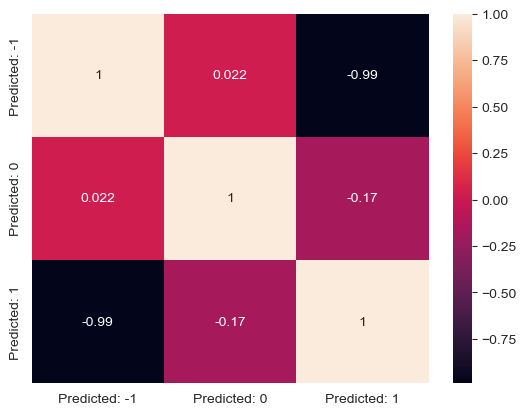

In [171]:
from sklearn.metrics import confusion_matrix
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

cm = confusion_matrix(y_test, y_pred)
matrix = pd.DataFrame(data=cm, index=['Actual: -1', 'Actual: 0','Actual: 1'], columns=['Predicted: -1', 'Predicted: 0','Predicted: 1'])
sns.heatmap(matrix.corr(), annot=True)
plt.show()

# Random Forest Classifier

In [177]:
rfd=RandomForestClassifier()
model=rfd.fit(x_train, y_train)
y_pred=model.predict(x_test)

In [178]:
print(classification_report(y_test, y_pred))

              precision    recall  f1-score   support

          -1       0.80      0.82      0.81      2656
           0       0.84      0.83      0.84      5055
           1       0.78      0.74      0.76      1479

    accuracy                           0.82      9190
   macro avg       0.80      0.80      0.80      9190
weighted avg       0.82      0.82      0.82      9190



In [155]:
print(accuracy_score(y_test, y_pred))

0.816430903155604


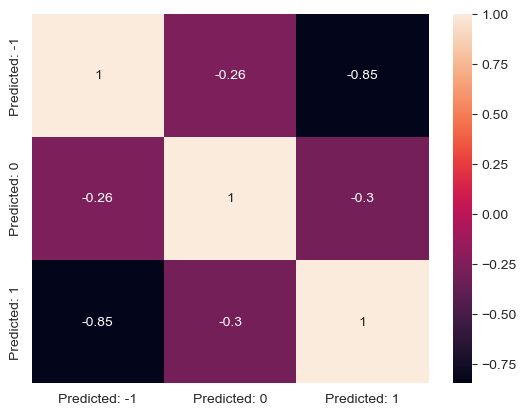

In [162]:
from sklearn.metrics import confusion_matrix
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

cm = confusion_matrix(y_test, y_pred)
matrix = pd.DataFrame(data=cm, index=['Actual: -1', 'Actual: 0','Actual: 1'], columns=['Predicted: -1', 'Predicted: 0','Predicted: 1'])
sns.heatmap(matrix.corr(), annot=True)
plt.show()

# Decision Tree Classifier

In [192]:
dc=DecisionTreeClassifier()
model=dc.fit(x_train, y_train)
y_pred=model.predict(x_test)

In [193]:
print(classification_report(y_test, y_pred))

              precision    recall  f1-score   support

          -1       0.71      0.71      0.71      2656
           0       0.77      0.76      0.77      5055
           1       0.64      0.66      0.65      1479

    accuracy                           0.73      9190
   macro avg       0.71      0.71      0.71      9190
weighted avg       0.73      0.73      0.73      9190



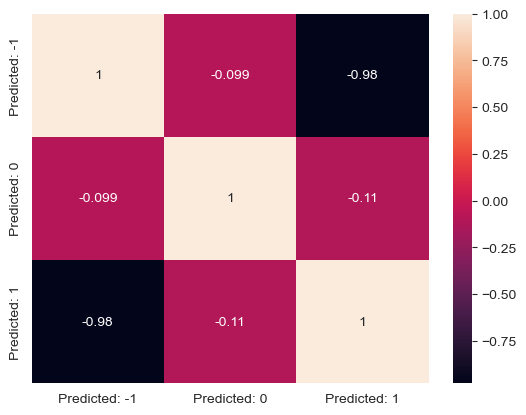

In [195]:
from sklearn.metrics import confusion_matrix
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

cm = confusion_matrix(y_test, y_pred)
matrix = pd.DataFrame(data=cm, index=['Actual: -1', 'Actual: 0','Actual: 1'], columns=['Predicted: -1', 'Predicted: 0','Predicted: 1'])
sns.heatmap(matrix.corr(), annot=True)
plt.show()

In [196]:
print(accuracy_score(y_test, y_pred))

0.732208922742111


# Gradient Boosting Classifier

In [197]:
from sklearn.ensemble import GradientBoostingClassifier

# Create a Gradient Boosting classifier
model = GradientBoostingClassifier()

# Fit the model on the training data
model.fit(x_train, y_train)

# Make predictions on the test data
y_pred = model.predict(x_test)

In [198]:
print(classification_report(y_test, y_pred))

              precision    recall  f1-score   support

          -1       0.76      0.69      0.72      2656
           0       0.79      0.79      0.79      5055
           1       0.60      0.70      0.64      1479

    accuracy                           0.74      9190
   macro avg       0.71      0.72      0.72      9190
weighted avg       0.75      0.74      0.74      9190



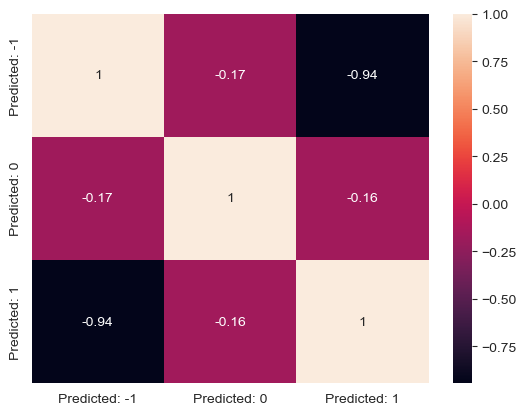

In [199]:
from sklearn.metrics import confusion_matrix
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

cm = confusion_matrix(y_test, y_pred)
matrix = pd.DataFrame(data=cm, index=['Actual: -1', 'Actual: 0','Actual: 1'], columns=['Predicted: -1', 'Predicted: 0','Predicted: 1'])
sns.heatmap(matrix.corr(), annot=True)
plt.show()

In [200]:
print(accuracy_score(y_test, y_pred))

0.7435255712731229


# K Neighbors Classifier

In [201]:
from sklearn.neighbors import KNeighborsClassifier

# Create a KNN classifier
model = KNeighborsClassifier()

# Fit the model on the training data
model.fit(x_train, y_train)

# Make predictions on the test data
y_pred = model.predict(x_test)

C:\Users\sujan\anaconda3\lib\site-packages\sklearn\neighbors\_classification.py:228: FutureWarning: Unlike other reduction functions (e.g. `skew`, `kurtosis`), the default behavior of `mode` typically preserves the axis it acts along. In SciPy 1.11.0, this behavior will change: the default value of `keepdims` will become False, the `axis` over which the statistic is taken will be eliminated, and the value None will no longer be accepted. Set `keepdims` to True or False to avoid this warning.
  mode, _ = stats.mode(_y[neigh_ind, k], axis=1)


In [202]:
print(classification_report(y_test, y_pred))

              precision    recall  f1-score   support

          -1       0.74      0.77      0.76      2656
           0       0.79      0.81      0.80      5055
           1       0.71      0.60      0.65      1479

    accuracy                           0.76      9190
   macro avg       0.75      0.73      0.73      9190
weighted avg       0.76      0.76      0.76      9190



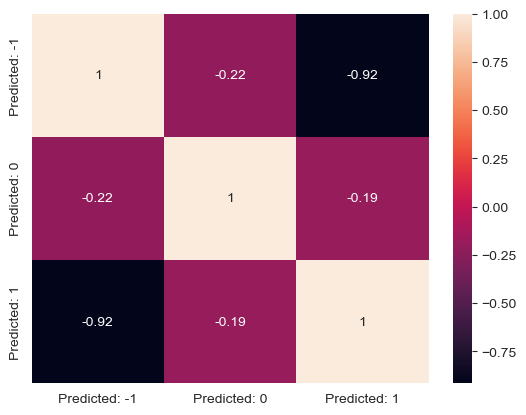

In [203]:
from sklearn.metrics import confusion_matrix
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

cm = confusion_matrix(y_test, y_pred)
matrix = pd.DataFrame(data=cm, index=['Actual: -1', 'Actual: 0','Actual: 1'], columns=['Predicted: -1', 'Predicted: 0','Predicted: 1'])
sns.heatmap(matrix.corr(), annot=True)
plt.show()

In [204]:
print(accuracy_score(y_test, y_pred))

0.7630032644178455


# Naive Bayes

In [205]:

from sklearn.naive_bayes import GaussianNB

# Create a Naive Bayes classifier
model = GaussianNB()

# Fit the model on the training data
model.fit(x_train, y_train)

# Make predictions on the test data
y_pred = model.predict(x_test)

In [206]:
print(classification_report(y_test, y_pred))

              precision    recall  f1-score   support

          -1       0.68      0.68      0.68      2656
           0       0.81      0.63      0.71      5055
           1       0.46      0.79      0.58      1479

    accuracy                           0.67      9190
   macro avg       0.65      0.70      0.66      9190
weighted avg       0.71      0.67      0.68      9190



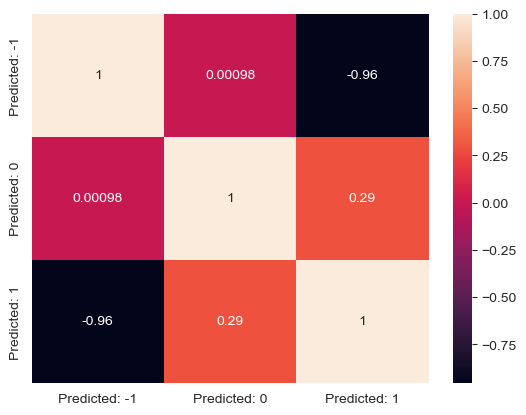

In [207]:
from sklearn.metrics import confusion_matrix
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

cm = confusion_matrix(y_test, y_pred)
matrix = pd.DataFrame(data=cm, index=['Actual: -1', 'Actual: 0','Actual: 1'], columns=['Predicted: -1', 'Predicted: 0','Predicted: 1'])
sns.heatmap(matrix.corr(), annot=True)
plt.show()

In [208]:
print(accuracy_score(y_test, y_pred))

0.6725788900979325


### XG boost gives high Accuracy of 81.% ., so we can choose Random forest